In [1]:
TESTING = False # Use 1% of data for testing. IF false - full dataset takes more time
MAX_FEATURE_SET = True
#DIAGNOSIS = False
IMPUTE_EACH_ID = False # imputation within each icustay_id
IMPUTE_COLUMN = False # imputation based on whole column

In [ ]:
#data preprocessing
from datetime import datetime
print(datetime.now())
import pandas as pd
import numpy as np
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
import collections
from collections import defaultdict
#import time
from datetime import datetime

#logistic regression model: train and evaluation and XGB 
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from  sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from sklearn import metrics
from sklearn.metrics import roc_curve, precision_recall_curve, f1_score, roc_auc_score, auc, accuracy_score
from sklearn.model_selection import cross_validate
from sklearn.impute import SimpleImputer
import matplotlib.lines as mlines
import matplotlib.transforms as mtransforms
from matplotlib import pyplot as plt
import seaborn as sns
import shap
import joblib

In [3]:
# the full files pathes are here
# time dependent
DATA_PATH_stages="~/data/volume_2/kdigo_stages_measured.csv" 
DATA_PATH_labs = "~/data/volume_2/labs-kdigo_stages_measured.csv" 
DATA_PATH_vitals = "~/data/volume_2/vitals-kdigo_stages_measured.csv" 
DATA_PATH_vents = "~/data/volume_2/vents-vasopressor-sedatives-kdigo_stages_measured.csv"
#no time dependent
DATA_PATH_detail="~/data/volume_2/icustay_detail-kdigo_stages_measured.csv" #age constraint
#DATA_PATH_icd = "../data/diagnoses_icd_aki_measured.csv" #AL was "...measured 2.csv"

SEPARATOR=";"

In [4]:
# Set parameter as constant 

#which classifier to use, only run one classifier at one time 
ALL_STAGES = False
CLASS1 = True   #AnyAKI
#CLASS2 = True    #ModerateSevereAKI
#CLASS3 = False    #SevereAKI

MAX_DAYS = 35

NORMALIZATION = 'min-max' 

CAPPING_THRESHOLD_UPPER = 0.99
CAPPING_THRESHOLD_LOWER = 0.01

#Age constraints: adults
ADULTS_MIN_AGE = 18
ADULTS_MAX_AGE = -1


SPLIT_SIZE = 0.2

#Two options to deal with time series data
FIRST_TURN_POS = True #True #False # the first charttime that turn pos as bechmark for Target
LAST_CHARTTIME = False #the last charttime as bechmark for Target

# resampling or not
TIME_SAMPLING = True 
SAMPLING_INTERVAL = '6H'
RESAMPLE_LIMIT = 16 # 4 days*6h interval
MOST_COMMON = False #resampling with most common
# if MOST_COMMON is not applied,sampling with different strategies per kind of variable, 
# numeric variables use mean value, categorical variables use max value

IMPUTE_METHOD = 'most_frequent' 
FILL_VALUE = 0 #fill missing value and ragged part of 3d array

# How much time the prediction should occur (hours)
HOURS_AHEAD = 48

# precentage of dataset to be used for testing model
TEST_SIZE = 0.1


In [5]:
#set changable info corresponding to each classifier as variables

min_set =  ["icustay_id", "charttime", "creat", "uo_rt_6hr", "uo_rt_12hr", "uo_rt_24hr", "aki_stage"]

max_set = ['icustay_id', 'charttime', 'aki_stage', 'hadm_id','aniongap_avg', 'bicarbonate_avg', 
           'bun_avg','chloride_avg', 'creat', 'diasbp_mean', 'glucose_avg', 'heartrate_mean',
           'hematocrit_avg', 'hemoglobin_avg', 'potassium_avg', 'resprate_mean','sodium_avg', 'spo2_mean', 'sysbp_mean', 
           'uo_rt_12hr', 'uo_rt_24hr','uo_rt_6hr', 'wbc_avg', 'sedative', 'vasopressor', 'vent', 'age', 'F','M', 
           'asian', 'black', 'hispanic', 'native', 'other', 'unknown','white', 'ELECTIVE', 'EMERGENCY', 'URGENT']

In [6]:
# Some functions used later


def cap_data(df):
    print("Capping between the {} and {} quantile".format(CAPPING_THRESHOLD_LOWER, CAPPING_THRESHOLD_UPPER))
    cap_mask = df.columns.difference(['icustay_id', 'charttime', 'hadm_id', 'subject_id', 'aki_stage', 'sedative', 'vasopressor', 'vent',
                                      'ethnicity_grouped', 'admission_type', 'gender'])
    df[cap_mask] = df[cap_mask].clip(df[cap_mask].quantile(CAPPING_THRESHOLD_LOWER),
                                     df[cap_mask].quantile(CAPPING_THRESHOLD_UPPER),
                                     axis=1)

    return df

# impute missing value in resampleing data with most common based on each id
def fast_mode(df, key_cols, value_col):
    """ Calculate a column mode, by group, ignoring null values. 
    
    key_cols : list of str - Columns to groupby for calculation of mode.
    value_col : str - Column for which to calculate the mode. 

    Return
    pandas.DataFrame
        One row for the mode of value_col per key_cols group. If ties, returns the one which is sorted first. """
    return (df.groupby(key_cols + [value_col]).size() 
              .to_frame('counts').reset_index() 
              .sort_values('counts', ascending=False) 
              .drop_duplicates(subset=key_cols)).drop('counts',axis=1)

def normalise_data(df, norm_mask):
    print("Normalizing in [0,1] with {} normalization".format(NORMALIZATION))
    
    df[norm_mask] = (df[norm_mask] - df[norm_mask].min()) / (df[norm_mask].max() - df[norm_mask].min())
    
    return df


#get max shape of 3d array
def get_dimensions(array, level=0):   
    yield level, len(array)
    try:
        for row in array:
            yield from get_dimensions(row, level + 1)
    except TypeError: #not an iterable
        pass

def get_max_shape(array):
    dimensions = defaultdict(int)
    for level, length in get_dimensions(array):
        dimensions[level] = max(dimensions[level], length)
    return [value for _, value in sorted(dimensions.items())]

#pad the ragged 3d array to rectangular shape based on max size
def iterate_nested_array(array, index=()):
    try:
        for idx, row in enumerate(array):
            yield from iterate_nested_array(row, (*index, idx)) 
    except TypeError: # final level            
        yield (*index, slice(len(array))), array # think of the types

def pad(array, fill_value):
    dimensions = get_max_shape(array)
    result = np.full(dimensions, fill_value, dtype = np.float64)  
    for index, value in iterate_nested_array(array):
        result[index] = value 
    return result



In [7]:
print("read csv files")
#reading csv files
X = pd.read_csv(DATA_PATH_stages, sep= SEPARATOR)
X.drop(["aki_stage_creat", "aki_stage_uo"], axis = 1, inplace = True)
#remove totally empty rows 
X = X.dropna(how = 'all', subset = ['creat','uo_rt_6hr','uo_rt_12hr','uo_rt_24hr','aki_stage'])
print("convert charttime to timestamp")
X['charttime'] = pd.to_datetime(X['charttime'])
#merge rows if they have exact timestamp within same icustay_id AL: t substitutes missing values with zero
#X = X.groupby(['icustay_id', 'charttime']).sum().reset_index(['icustay_id', 'charttime'])

dataset_detail = pd.read_csv(DATA_PATH_detail, sep= SEPARATOR)  #age constraint
dataset_detail.drop(['dod', 'admittime','dischtime', 'los_hospital','ethnicity','hospital_expire_flag', 'hospstay_seq',
       'first_hosp_stay', 'intime', 'outtime', 'los_icu', 'icustay_seq','first_icu_stay'], axis = 1, inplace = True)


read csv files
convert charttime to timestamp


In [8]:
dataset_labs = pd.read_csv(DATA_PATH_labs, sep= SEPARATOR) # 'bands lactate platelet ptt inr pt
dataset_labs.drop(['albumin_min', 'albumin_max','bilirubin_min', 'bilirubin_max','bands_min', 'bands_max',
                   'lactate_min', 'lactate_max','platelet_min', 'platelet_max','ptt_min', 'ptt_max', 
                   'inr_min', 'inr_max', 'pt_min', 'pt_max'], axis = 1, inplace = True)
dataset_labs = dataset_labs.dropna(subset=['charttime'])
dataset_labs = dataset_labs.dropna(subset=dataset_labs.columns[4:], how='all')
dataset_labs['charttime'] = pd.to_datetime(dataset_labs['charttime'])
dataset_labs = dataset_labs.sort_values(by=['icustay_id', 'charttime'])

if  MAX_FEATURE_SET:
    dataset_vitals = pd.read_csv(DATA_PATH_vitals, sep= SEPARATOR)  
    dataset_vents = pd.read_csv(DATA_PATH_vents , sep= SEPARATOR)
    #dataset_icd = pd.read_csv(DATA_PATH_icd, sep= SEPARATOR)

    dataset_vitals.drop(["heartrate_min", "heartrate_max","sysbp_min", "sysbp_max","diasbp_min", "diasbp_max",
                        'meanbp_min','meanbp_max', 'meanbp_mean','tempc_min', 'tempc_max', 'tempc_mean',
                        "resprate_min", "resprate_max", "spo2_min", "spo2_max", "glucose_min", "glucose_max"], axis = 1, inplace = True)
          
    print("convert charttime to timestamp")
    dataset_vitals['charttime'] = pd.to_datetime(dataset_vitals['charttime'])
    dataset_vents['charttime'] = pd.to_datetime(dataset_vents['charttime'])
    
    dataset_vitals = dataset_vitals.sort_values(by=['icustay_id', 'charttime'])
    dataset_vents = dataset_vents.sort_values(by=['icustay_id', 'charttime'])
    
    # AL drop those where all columns are nan
    dataset_vitals = dataset_vitals.dropna(subset=dataset_vitals.columns[4:], how='all')   
     

convert charttime to timestamp


In [9]:
# Labs file: instead of min and max their avg
counter = 0
col1 = 4
col2 = 5
null_l = [] # no null values in those that are different
changed = 0 # 4316 records changed to avg

while counter < 11:
    row = 0
# find where min and max are different and save their row indices 
    while row < len(dataset_labs):
        a = dataset_labs.iloc[row,col1]
        b = dataset_labs.iloc[row,col2]
        if a==b or (np.isnan(a) and np.isnan(b)):
            pass
        elif a!=b:
            changed +=1
            avg = (a+b)/2
            dataset_labs.iloc[row,col1] = avg
            if (np.isnan(a) and ~np.isnan(b)) or (np.isnan(b) and ~np.isnan(a)):
                null_l.append(row)
        else:
            print(a)
            print(b)
        row +=1       
    # delete the redundant column max, update counters
    dataset_labs.drop(dataset_labs.columns[col2], axis=1, inplace = True)
    counter = counter+1
    col1 = col1+1
    col2 = col2+1

dataset_labs.columns = ['subject_id','hadm_id', 'icustay_id', 'charttime', 'aniongap_avg', 'bicarbonate_avg', 
                        'creatinine_avg', 'chloride_avg', 'glucose_avg', 'hematocrit_avg','hemoglobin_avg',
                        'potassium_avg', 'sodium_avg', 'bun_avg', 'wbc_avg']
if len(null_l)>0:
    print("null values encountered")

In [10]:
print("Merge creatinine and glucose.")
# merge creatinine from labs and set with labels
creat_l = dataset_labs[['icustay_id','charttime','creatinine_avg']].copy()
creat_l = creat_l.dropna(subset=['creatinine_avg'])
creat = X[['icustay_id','charttime', 'creat']].copy()
creat = creat.dropna(subset=['creat'])
creat_l = creat_l.rename(columns={"creatinine_avg": "creat"})
creat = creat.append(creat_l, ignore_index=True)
creat.drop_duplicates(inplace = True)
#delete old columns
dataset_labs.drop(["creatinine_avg"], axis = 1, inplace = True)
dataset_labs = dataset_labs.dropna(subset=dataset_labs.columns[4:], how='all')
X.drop(["creat"], axis = 1, inplace = True)
#merge new column
X = pd.merge(X, creat, on = ["icustay_id", "charttime"], sort = True, how= "outer", copy = False)

if MAX_FEATURE_SET:
    # merge glucose from vitals and labs
    glucose_v = dataset_vitals[['subject_id','hadm_id','icustay_id','charttime', 'glucose_mean']].copy()
    glucose_v = glucose_v.dropna(subset=['glucose_mean'])
    glucose = dataset_labs[['subject_id','hadm_id','icustay_id','charttime', 'glucose_avg']].copy()
    glucose = glucose.dropna(subset=['glucose_avg'])
    glucose_v = glucose_v.rename(columns={"glucose_mean": "glucose_avg"})
    glucose = glucose.append(glucose_v, ignore_index=True)
    glucose.drop_duplicates(inplace = True)
    #delete old columns
    dataset_labs.drop(["glucose_avg"], axis = 1, inplace = True)
    dataset_vitals.drop(["glucose_mean"], axis = 1, inplace = True)
    dataset_vitals = dataset_vitals.dropna(subset=dataset_vitals.columns[4:], how='all')
    #merge new column
    dataset_labs = pd.merge(dataset_labs, glucose, on = ['subject_id','hadm_id','icustay_id','charttime',], sort = True, how= "outer", copy = False)
    
dataset_labs = dataset_labs.sort_values(by=['icustay_id', 'charttime'], ignore_index = True)
X = X.sort_values(by=['icustay_id', 'charttime'], ignore_index = True)

Merge creatinine and glucose.


In [11]:
print("Merging labs, vitals and vents files")
#merge files with time-dependent data, based on icustay_id and charttime
if MAX_FEATURE_SET:
    X = pd.merge(X, dataset_labs, on = ["icustay_id", "charttime"], how= "outer", copy = False)
    X = pd.merge(X, dataset_vitals, on = ["icustay_id", "charttime","subject_id", "hadm_id"], how= "outer", copy = False)
    X = pd.merge(X, dataset_vents, on = ["icustay_id", "charttime"], how= "outer", copy = False) 
    X.drop(["subject_id"], axis = 1, inplace = True) 


Merging labs, vitals and vents files


In [12]:
print("start preprocessing time dependent data") 
print("Removing patients under the min age")
dataset_detail = dataset_detail.loc[dataset_detail['age'] >= ADULTS_MIN_AGE]
adults_icustay_id_list = dataset_detail['icustay_id'].unique()
X = X[X.icustay_id.isin(adults_icustay_id_list)].sort_values(by=['icustay_id'], ignore_index = True)
X = X.sort_values(by=['icustay_id', 'charttime'], ignore_index = True)
adults_icustay_id_list = np.sort(adults_icustay_id_list)

start preprocessing time dependent data
Removing patients under the min age


In [13]:
print("drop icustay_id with time span less than 48hrs")
def more_than_HOURS_ahead(adults_icustay_id_list, X):
    drop_list = []
    los_list = [] # calculating LOS ICU based on charttime
    long_stays_id = [] # LOS longer than MAX DAYS days
    last_charttime_list = []
    seq_length = X.groupby(['icustay_id'],as_index=False).size()
    id_count = 0
    first_row_index = 0

    while id_count < len(adults_icustay_id_list):
        icustay_id = adults_icustay_id_list[id_count]
        last_row_index = first_row_index + seq_length.iloc[id_count,1]-1
        first_time = X.iat[first_row_index, X.columns.get_loc('charttime')]
        last_time = X.iat[last_row_index, X.columns.get_loc('charttime')]
        los = round(float((last_time - first_time).total_seconds()/60/60/24),4) # in days
        if los < HOURS_AHEAD/24:
            drop_list.append(icustay_id)
        else:
            los_list.append(los)
            if los > MAX_DAYS:
                long_stays_id.append(icustay_id)
                last_charttime_list.append(last_time)
        # udpate for the next icustay_id
        first_row_index = last_row_index+1
        id_count +=1
    if len(long_stays_id) != len(last_charttime_list):
        print('ERROR')
    print("%d long stays" % len(long_stays_id))
    # drop all the rows with the saved icustay_id
    print("there are %d id-s shorter than 48 hours" % len(drop_list))
    X = X[~X.icustay_id.isin(drop_list)]
    id_list = X['icustay_id'].unique()
    X = X.sort_values(by=['icustay_id', 'charttime'], ignore_index = True)
    
    return id_list, X, long_stays_id,last_charttime_list

id_list, X, long_stays_id,last_charttime_list  = more_than_HOURS_ahead(adults_icustay_id_list, X)


long = pd.DataFrame()
long['icustay_id']  = long_stays_id
long['last_time']  = last_charttime_list


drop icustay_id with time span less than 48hrs
2302 long stays
there are 5214 id-s shorter than 48 hours


In [14]:
# deleting rows that are not within MAX_DAYS (35) period
i = 0 # long df index
drop_long_time = []
    
while i < len(long_stays_id):
    j = 0
    all_rows = X.index[X['icustay_id'] == long.loc[i,'icustay_id']].tolist()
    while j < len(all_rows):
        time = X.iat[all_rows[j], X.columns.get_loc('charttime')]
        # if keep last MAX_DAYS 
        if (long.loc[i,'last_time'] - time).total_seconds() > MAX_DAYS*24*60*60:
            drop_long_time.append(all_rows[j])
            j +=1
        else:
            break
    i +=1       
X.drop(X.index[drop_long_time], inplace=True) 

# checking for 48h min length again
id_list, X, long_stays_id,last_charttime_list  = more_than_HOURS_ahead(id_list, X)
dataset_detail = dataset_detail[dataset_detail.icustay_id.isin(id_list)].sort_values(by=['icustay_id'], ignore_index = True)


0 long stays
there are 1 id-s shorter than 48 hours


# For testing purpose, use small amount of data first

In [15]:
#For testing purpose, use small amount of data first
if TESTING:
    rest, id_list = train_test_split(id_list, test_size= 0.01, random_state=42)
    X = X[X.icustay_id.isin(id_list)].sort_values(by=['icustay_id'])
    dataset_detail = dataset_detail[dataset_detail.icustay_id.isin(id_list)].sort_values(by=['icustay_id'])

# Resample  and impute

In [16]:
if (TIME_SAMPLING and MOST_COMMON):
    print("resampling: MOST_COMMON")
    # Resample the data using assigned interval,mode() for most common
    X = X.set_index('charttime').groupby('icustay_id').resample(SAMPLING_INTERVAL).mode().reset_index()
elif TIME_SAMPLING:
    print("resampling: MEAN & ZERO")
    # Sampling with different strategies per kind of variable
    label = ['aki_stage']
    skip = ['icustay_id', 'charttime', 'aki_stage']
    if MAX_FEATURE_SET:
        discrete_feat = ['sedative', 'vasopressor', 'vent', 'hadm_id']
        skip.extend(discrete_feat)    
    # all features that are not in skip are numeric
    numeric_feat = list(X.columns.difference(skip))
    
    # Applying aggregation to features depending on their type
    X = X.set_index('charttime').groupby('icustay_id').resample(SAMPLING_INTERVAL)
    if MAX_FEATURE_SET:
        X_discrete = X[discrete_feat].max().fillna(FILL_VALUE).astype(np.int64)
    X_numeric = X[numeric_feat].mean() 
    X_label = X['aki_stage'].max()
    print("Merging sampled features")
    try:
        X = pd.concat([X_numeric, X_discrete,X_label], axis=1).reset_index()
    except:
        X = pd.concat([X_numeric,X_label], axis=1).reset_index()
print(X.shape)
#Label forward fill
X['aki_stage'] = X['aki_stage'].ffill(limit=RESAMPLE_LIMIT)

resampling: MEAN & ZERO
Merging sampled features
(2156523, 26)


In [17]:
print("Imputation.")
# do imputation of label with zero if there are still missing values
X['aki_stage'] = X['aki_stage'].fillna(0)
# using most common within each icustay_id
if IMPUTE_EACH_ID:
    # set a new variable so won't change the orginial X
    column_name = list(X.columns)
    column_name.remove(column_name[0]) 
    for feature in column_name:
        X.loc[X[feature].isnull(), feature] = X.icustay_id.map(fast_mode(X, ['icustay_id'], feature).set_index('icustay_id')[feature])       

# imputation based on whole column
if IMPUTE_COLUMN:
    imp = SimpleImputer(missing_values=np.nan, strategy= IMPUTE_METHOD)
    cols = list(X.columns)
    cols = cols[2:23]
    X[cols]=imp.fit_transform(X[cols])  

# If no imputation method selected or only impute each id, for the remaining nan impute direclty with FILL_VALUE
X = X.fillna(FILL_VALUE) 

Imputation.


In [18]:
# more comfortable to review in this order
try:
    cols = ['icustay_id', 'charttime','aki_stage','hadm_id','aniongap_avg','bicarbonate_avg', 'bun_avg','chloride_avg',
            'creat','diasbp_mean', 'glucose_avg', 'heartrate_mean', 'hematocrit_avg','hemoglobin_avg', 
            'potassium_avg', 'resprate_mean', 'sodium_avg','spo2_mean', 'sysbp_mean', 'uo_rt_12hr', 
            'uo_rt_24hr', 'uo_rt_6hr','wbc_avg', 'sedative', 'vasopressor', 'vent' ]
    X = X[cols]
    print("success")
except:
    try:
        cols = ['icustay_id', 'charttime','aki_stage','creat','uo_rt_12hr', 'uo_rt_24hr', 'uo_rt_6hr']
        X = X[cols]
    except:
        print("error")

success


In [19]:
print("binarise labels")
if ALL_STAGES:
    pass
elif CLASS1:
    X.loc[X['aki_stage'] > 1, 'aki_stage'] = 1
elif CLASS2:
    X.loc[X['aki_stage'] < 2, 'aki_stage'] = 0
    X.loc[X['aki_stage'] > 1, 'aki_stage'] = 1
elif CLASS3:
    X.loc[X['aki_stage'] < 3, 'aki_stage'] = 0
    X.loc[X['aki_stage'] > 2, 'aki_stage'] = 1

binarise labels


In [20]:
#print("Shifting the labels 48 h") # by 8 position : 6h sampling*8=48h and ffil 8 newly empty ones
# group by
X['aki_stage'] = X.groupby('icustay_id')['aki_stage'].shift(-(HOURS_AHEAD // int(SAMPLING_INTERVAL[:-1])))
X = X.dropna(subset=['aki_stage'])
X['icustay_id'].nunique()
X.shape

(1774515, 26)

# Last charttime (option1)

In [21]:
if LAST_CHARTTIME:
    print("Here we choose the last charttime as bechmark for Target")
    print("find last charttime for each icustay_id")
    #extract the aki_stage value of row of "last" charttime of each icustay_id as the label/target set
    #find last charttime for each icustay_id

    target_list = [] #to store target(y)
    last_charttime_list= [] #a list to store last charttime for every icustay_id
    last_charttime_index_list = [] #a list to store index when last charttime for every icustay_id

    dataset_size = X.shape[0]
    k=0 #index
    h=0 #the times that id matches

    for extract_id in id_list:
        while k < X:
            if X.iat[k, X.columns.get_loc('icustay_id')] == extract_id:
                if h==0 and k != dataset_size-1:
                    k = k+1
                    h = h+1
                elif h !=0:
                    if k == dataset_size-1:
                        target_list.append(X.iat[k, X.columns.get_loc('aki_stage')])
                        last_charttime_list.append(X.iat[k, X.columns.get_loc('charttime')])
                        last_charttime_index_list.append(k)
                    k = k+1
            elif X.iat[k, X.columns.get_loc('icustay_id')] != extract_id:
                target_list.append(X.iat[k-1, X.columns.get_loc('aki_stage')])
                last_charttime_list.append(X.iat[k-1, X.columns.get_loc('charttime')])
                last_charttime_index_list.append(k-1)
                h=0
                break
                

# First Turn Pos (option 2)

In [22]:
if FIRST_TURN_POS:
    # create one label per icustay_id - first turn positive approach

    X = X.sort_values(by=['icustay_id', 'charttime'], ignore_index = True)
    id_list.sort()
    last_charttime_list= []

    index_list = []
    label_list = []

    first_row_index = 0
    id_count = 0
    seq_length = X.groupby(['icustay_id'],as_index=False).size()

    for ID in id_list:
        last_row_index = first_row_index + seq_length.iloc[id_count,1]-1
        a = X.loc[X['icustay_id']==ID].aki_stage
        if 1 not in a.values:
            label_list.append(0)
            last_charttime_list.append(X.iat[last_row_index, X.columns.get_loc('charttime')]) 
            index_list.append(last_row_index)
        elif 1 in a.values:
            label_list.append(1)
            row = first_row_index
            while row != last_row_index+1:
                if X.iat[row, X.columns.get_loc('aki_stage')]==0:
                    row +=1
                elif X.iat[row, X.columns.get_loc('aki_stage')]==1:
                    last_charttime_list.append(X.iat[row, X.columns.get_loc('charttime')])
                    index_list.append(row)
                    break
        first_row_index = last_row_index+1
        id_count +=1 
    X = X.drop(['aki_stage'], axis=1)
    Thresholds = pd.DataFrame({'icustay_id':id_list, 'charttime': last_charttime_list, 'final_label':label_list})
    X = (Thresholds.merge(X, on='icustay_id', how='left',suffixes=('_x','')).query("charttime_x >= charttime").reindex(columns=X.columns))        
    print(X.shape)
    X['icustay_id'].nunique()

(784755, 25)


In [23]:
label_register =  pd.DataFrame()
label_register['icustay_id'] = id_list
label_register['label'] = label_list

# 0. Data check

In [24]:
print(label_register.shape) # (47751, 2)
print(X.shape) # (784755, 25)

(47751, 2)
(784755, 25)


# 1. Cap and normalise dynamic data

In [25]:
X = cap_data(X)

Capping between the 0.01 and 0.99 quantile


In [26]:
X = normalise_data(X, numeric_feat)

Normalizing in [0,1] with min-max normalization


# 1. Split, reshape and fill, flatten

In [27]:
print("divide dataset into train, test and validation sets")
id_train, id_test_val = train_test_split(id_list, test_size = SPLIT_SIZE, random_state = 42) # train set is 80%)
# to ensure the same split as LSTM
id_valid, id_test = train_test_split(id_test_val, test_size = 0.5, random_state = 42) # test 10% valid 10%
print("test is %d" %len(id_test))
id_train = np.concatenate((id_train, id_valid), axis=None)
print("train is %d" % len(id_train))

divide dataset into train, test and validation sets
test is 4776
train is 42975


In [28]:
X_train = X[X.icustay_id.isin(id_train)].sort_values(by=['icustay_id'])
X_test = X[X.icustay_id.isin(id_test)].sort_values(by=['icustay_id'], ignore_index = True) 
X_test = X_test.sort_values(by=['icustay_id', 'charttime'], ignore_index = True)
X_train = X_train.sort_values(by=['icustay_id', 'charttime'], ignore_index = True)

In [29]:
X_train = X_train.drop(['hadm_id', 'charttime'], axis=1)
X_test = X_test.drop(['hadm_id', 'charttime'], axis=1)

In [30]:
y_test = []
id_ordered = X_test['icustay_id'].unique()
for i in id_ordered:
    a = label_register.loc[label_register['icustay_id']==i].label
    y_test.append(a.values[0])
    
y_train = []
id_ordered = X_train['icustay_id'].unique()
for i in id_ordered:
    a = label_register.loc[label_register['icustay_id']==i].label
    y_train.append(a.values[0])

In [31]:
#print("reshape 2D dataframe to 3D Array, group by icustay_id")
X_train = np.array(list(X_train.groupby(['icustay_id'],as_index=False).apply(pd.DataFrame.to_numpy)))
print(X_train.shape)
#print("reshape 2D dataframe to 3D Array, group by icustay_id")
X_test = np.array(list(X_test.groupby(['icustay_id'],as_index=False).apply(pd.DataFrame.to_numpy)))
print(X_test.shape)

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


(42975,)
(4776,)


Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


In [32]:
print("fill ragged part(missing value) of 3d array with FILL_VALUE")
X_train = pad(X_train, FILL_VALUE)
X_train = X_train[:,:,1:] #delete icustay id
print(X_train.shape)
X_test = pad(X_test, FILL_VALUE)
X_test = X_test[:,:,1:] #delete icustay id
print(X_test.shape)
# features = X_train.shape[2]
# timestamps = X_train.shape[1]

fill ragged part(missing value) of 3d array with FILL_VALUE
(42975, 133, 22)
(4776, 133, 22)


In [33]:
print("flatten 3D array back to 2D array")
nsamples, nx, ny = X_train.shape
X_train = X_train.reshape((nsamples,nx*ny))
print(X_train.shape)
nsamples, nx, ny = X_test.shape
X_test = X_test.reshape((nsamples,nx*ny))
print(X_test.shape)

flatten 3D array back to 2D array
(42975, 2926)
(4776, 2926)


In [34]:
np.amax(X_train) #test
np.amax(X_test)

1.0

# 2. Add categorical features (details), cap, and normalise

In [35]:
# use demo dataset to avoid damaging original data
X_train_demo = X_train
X_test_demo = X_test
dataset_detail_demo = dataset_detail

In [36]:
print("start preprocessing not time dependent data (train)")
if MAX_FEATURE_SET:
    #extract datasets based on id_list -> train list
    dataset_detail_train = dataset_detail_demo.loc[dataset_detail_demo['icustay_id'].isin(id_train)]
    #sort by ascending order
    dataset_detail_train = dataset_detail_train.sort_values(by=['icustay_id'])
    subject_id_train = dataset_detail_train["subject_id"].unique()
    #cap and normalise
    dataset_detail_train = cap_data(dataset_detail_train)
    dataset_detail_train = normalise_data(dataset_detail_train, ['age'])
    #transfrom categorical data to binary form
    dataset_detail_train = dataset_detail_train.join(pd.get_dummies(dataset_detail_train.pop('gender')))
    dataset_detail_train = dataset_detail_train.join(pd.get_dummies(dataset_detail_train.pop("ethnicity_grouped")))
    dataset_detail_train = dataset_detail_train.join(pd.get_dummies(dataset_detail_train.pop('admission_type')))
    dataset_detail_train = dataset_detail_train.drop(['subject_id', 'hadm_id'], axis=1)
    dataset_detail_train['age'] = dataset_detail_train['age'].clip(dataset_detail_train['age'].quantile(CAPPING_THRESHOLD_LOWER),
                                                               dataset_detail_train['age'].quantile(CAPPING_THRESHOLD_UPPER))
    dataset_detail_train = np.asarray(dataset_detail_train.drop('icustay_id', axis = 1))
    X_train_demo = np.concatenate((X_train_demo, dataset_detail_train), axis = 1)

start preprocessing not time dependent data (train)
Capping between the 0.01 and 0.99 quantile
Normalizing in [0,1] with min-max normalization


In [37]:
print("start preprocessing not time dependent data (test)")
if MAX_FEATURE_SET:
    #extract datasets based on id_list -> train list
    dataset_detail_test = dataset_detail_demo.loc[dataset_detail_demo['icustay_id'].isin(id_test)]
    #sort by ascending order
    dataset_detail_test = dataset_detail_test.sort_values(by=['icustay_id'])
    subject_id_test = dataset_detail_test["subject_id"].unique()
    #cap and normalise
    dataset_detail_test = cap_data(dataset_detail_test)
    dataset_detail_test = normalise_data(dataset_detail_test, ['age'])
    #transfrom categorical data to binary form
    dataset_detail_test = dataset_detail_test.join(pd.get_dummies(dataset_detail_test.pop('gender')))
    dataset_detail_test = dataset_detail_test.join(pd.get_dummies(dataset_detail_test.pop("ethnicity_grouped")))
    dataset_detail_test = dataset_detail_test.join(pd.get_dummies(dataset_detail_test.pop('admission_type')))
    dataset_detail_test = dataset_detail_test.drop(['subject_id', 'hadm_id'], axis=1)
    dataset_detail_test = np.asarray(dataset_detail_test.drop('icustay_id', axis = 1))
    X_test_demo = np.concatenate((X_test_demo, dataset_detail_test), axis = 1)

start preprocessing not time dependent data (test)
Capping between the 0.01 and 0.99 quantile
Normalizing in [0,1] with min-max normalization


In [38]:
X_train = X_train_demo
X_test = X_test_demo

# Evaluation functions

In [39]:
def performance (y_test, pred_probabilities):
    # performance
    fpr, tpr, thresholds = roc_curve(y_test, pred_probabilities)
    # compute roc auc
    roc_auc = roc_auc_score(y_test, pred_probabilities, average = 'micro')
    # compute Precision_Recall curves
    precision, recall, _ = precision_recall_curve(y_test, pred_probabilities)
    # compute PR_AUC
    pr_auc = metrics.auc(recall, precision)   
    # I add confusion matrix
    optimal_cut_off = round(thresholds[np.argmax(tpr - fpr)],4)
    a = np.where(pred_probabilities > optimal_cut_off, 1, 0)
    brier = round(metrics.brier_score_loss(y_test, pred_probabilities, sample_weight=None, pos_label=None),3)
    predictions = np.where(pred_probabilities > optimal_cut_off, 1, 0)  
    
    print ("Area Under ROC Curve: %0.2f" % roc_auc  )
    #print ("Area Under PR Curve(AP): %0.2f" % pr_auc  ) 
    print("Brier score : {:.3f}".format(brier))
    #print('Accuracy for Classifier : {:.2f}'.format(accuracy_score(y_test, predictions)))
    #print('Cut off: ' + str(optimal_cut_off))
    matrix = metrics.confusion_matrix(y_test, a, labels=None, normalize=None)
    #print(str(matrix))

In [40]:
def bin_total(y_true, y_prob, n_bins):
    bins = np.linspace(0., 1. + 1e-8, n_bins + 1)

    # In sklearn.calibration.calibration_curve, the last value in the array is always 0.
    binids = np.digitize(y_prob, bins) - 1

    return np.bincount(binids, minlength=len(bins))

def missing_bin(bin_array):
    midpoint = " "    
    if bin_array[0]==0:
        midpoint = "5%, "
    if bin_array[1]==0:
        midpoint = midpoint + "15%, "
    if bin_array[2]==0:
        midpoint = midpoint + "25%, "
    if bin_array[3]==0:
        midpoint = midpoint + "35%, " 
    if bin_array[4]==0:
        midpoint = midpoint + "45%, "
    if bin_array[5]==0:
        midpoint = midpoint + "55%, "
    if bin_array[6]==0:
        midpoint = midpoint + "65%, "
    if bin_array[7]==0:
        midpoint = midpoint + "75%, "
    if bin_array[8]==0:
        midpoint = midpoint + "85%, "
    if bin_array[9]==0:
        midpoint = midpoint + "95%, "
    return "The missing bins have midpoint values of "+ str(midpoint)

In [41]:
def build_graphs (y_test,pred_probabilities, classifier_name, plot_name, algorithm):
    
    # performance
    fpr, tpr, thresholds = roc_curve(y_test, pred_probabilities)
    # compute roc auc
    roc_auc = roc_auc_score(y_test, pred_probabilities, average = 'micro')
    # compute Precision_Recall curves
    precision, recall, _ = precision_recall_curve(y_test, pred_probabilities)
    # compute PR_AUC
    pr_auc = metrics.auc(recall, precision)

    # compute calibration curve
    LR_y, LR_x = calibration_curve(y_test, pred_probabilities, n_bins=10)
    #find out which one are the missing bins
    bin_array = bin_total(y_test, pred_probabilities , n_bins=10)
    print(missing_bin(bin_array))

    print("plot curves and save in one png file")
    #save three plots in one png file
    fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(7, 24))
    fig.subplots_adjust(wspace=0.3, hspace= 0.3)
    fig.suptitle('Evaluation of '+ plot_name)

    fpr, tpr, thresholds = roc_curve(y_test, pred_probabilities)
    
    # plot roc curve
    ax1.plot(fpr, tpr, 'C2', label=algorithm+" "+"Classifier " + str(classifier_name) + ", auc=" +str(round(roc_auc,2)))
    ax1.title.set_text('ROC AUC')
    ax1.set(xlabel='False Positive Rate', ylabel='True Positive Rate')
    ax1.legend(loc="lower right")

    # plot PR curve
    ax2.plot(recall, precision, 'C2', label=algorithm+" "+"Classifier " + str(classifier_name) + ", auc="+str(round(pr_auc,2)))
    ax2.title.set_text('PR AUC')
    ax2.set(xlabel='Recall', ylabel='Precision')
    ax2.legend(loc="lower right")

    # plot calibration curve
    ax3.plot(LR_x, LR_y, 'C2',marker='o', linewidth=1, label=plot_name)
    line = mlines.Line2D([0, 1], [0, 1], color='black')
    transform = ax3.transAxes
    line.set_transform(transform)
    ax3.add_line(line)
    ax3.title.set_text('Calibration plot for '+str(plot_name))
    ax3.set(xlabel= 'Predicted probability', ylabel= 'True probability in each bin')
    ax3.legend(loc="lower right")

    plt.savefig(plot_name+".png")
    plt.show()
    

In [42]:
def distribution(pred_probabilities, dist_name):
    #probabilities distributions graphs
    true_1 = pd.DataFrame(pred_probabilities, columns=['Predicted probabilities'])
    true_1['labels'] = y_test
    true_0 = true_1.copy(deep = True) 
    print(true_1.shape)
    indexNames = true_1[ true_1['labels'] == 0 ].index
    true_1.drop(indexNames , inplace=True)
    indexNames = true_0[ true_0['labels'] == 1 ].index
    true_0.drop(indexNames , inplace=True)
    true_1.drop(columns=['labels'], inplace = True)
    true_0.drop(columns=['labels'], inplace = True)
    
    sns.distplot(true_1['Predicted probabilities'], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3, "color": "g"}, label = 'Class 1')
    plt.ylabel('Density')
    sns.distplot(true_0['Predicted probabilities'], hist = False, kde = True,
                     kde_kws = {'shade': True, 'linewidth': 3}, label = 'Class 0')
    plt.title('Density Plot'+ dist_name)
    

# RUN MODELS

# Logistic Regression

# LR with best parameters

In [43]:
variables = ['Anion gap', 'Bicarbonate', 'Blood Urea Nitrogen', 'Chloride', 'Creatinine', 'Diastolic BP', 'Glucose', 'Heart rate', 
            'Hematocrit', 'Hemoglobin', 'Potassium', 'Respiratory rate', 'Sodium', 'Oxygen saturation', 'Systolic BP', 'Urine output 12h', 'Urine output 24h', 'Urine output 6h',
            'White cell count', 'Sedative', 'Vasopressor', 'Ventilation', 'Age', 'Female gender', 'Male gender', 'Asian ethnicity', 'Black ethnicity', 'Hispanic ethnicity', 'Native american', 
            'Other ethnicity', 'Ethnicity unknown', 'White ethnicity', 'Elective admission', 'Emergency admission', 'Urgent admission']



In [ ]:
print(datetime.now())
print("build LR")
model_LR1 = LogisticRegression(penalty = "l1", C = 0.1,fit_intercept = True, solver = 'saga', max_iter= 1000, 
                                  class_weight= 'balanced', random_state=42)

print("train LR")
model_LR1.fit(X_train, y_train) 
# Make predictions
LR1_pred = model_LR1.predict(X_test)
# Predict probabilities on testing points
LR1_probs = model_LR1.predict_proba(X_test)[::,1]

# Save the model to a .joblib file
joblib.dump(model_LR1, 'model_LR1.joblib')
print(datetime.now())

2023-06-13 23:41:56.295666
build LR
train LR
2023-06-14 00:00:48.680560


The max_iter was reached which means the coef_ did not converge


In [91]:
performance(y_test,LR1_probs)

'''
# NO IMP 
L1
Area Under ROC Curve: 0.90
Brier score : 0.128

 
# WITH IMP 
L1
Area Under ROC Curve: 0.84
Brier score : 0.161


# NEW DATASET NO IMP
Area Under ROC Curve: 0.89
Brier score : 0.133


# NEW DATASET WITH ID-IMP
Area Under ROC Curve: 0.84
Brier score : 0.164


'''

Area Under ROC Curve: 0.89
Brier score : 0.133


'\n# NO IMP \nL1\nArea Under ROC Curve: 0.90\nBrier score : 0.128\n\n \n# WITH IMP \nL1\nArea Under ROC Curve: 0.84\nBrier score : 0.161\n\n\n# NEW DATASET NO IMP\nArea Under ROC Curve: 0.89\nBrier score : 0.133\n\n\n# NEW DATASET WITH ID-IMP\nArea Under ROC Curve: 0.84\nBrier score : 0.164\n\n\n'

# LogR Feature importance

In [98]:
timestamps = 133
# The estimated coefficients will all be around 1:
LRcoefs = model_LR1.coef_
#LRcoefsStd = LRcoefsStd.flatten()
LRcoefs = LRcoefs.flatten()
LRcoefs.shape # 2939
# reshape to timestamps x features
logR_feat_dynamic = np.reshape(LRcoefs[:-13],(timestamps,-1))
logR_feat_dynamic = logR_feat_dynamic.mean(axis = 0)
logR_feat_static = LRcoefs[-13:]
logR_feat = np.concatenate((logR_feat_dynamic, logR_feat_static), axis = None)

In [99]:
logR_df =  pd.DataFrame(logR_feat, columns = ['Feature Importance'])
logR_df['Features'] = variables


import math
odds_ratio = []
for i in logR_feat:
    odds_ratio.append(math.exp(i))
logR_df['Odds ratio'] = odds_ratio

logR_df = logR_df.sort_values(by = ['Feature Importance'], ascending = False, ignore_index = True)
#logR_df


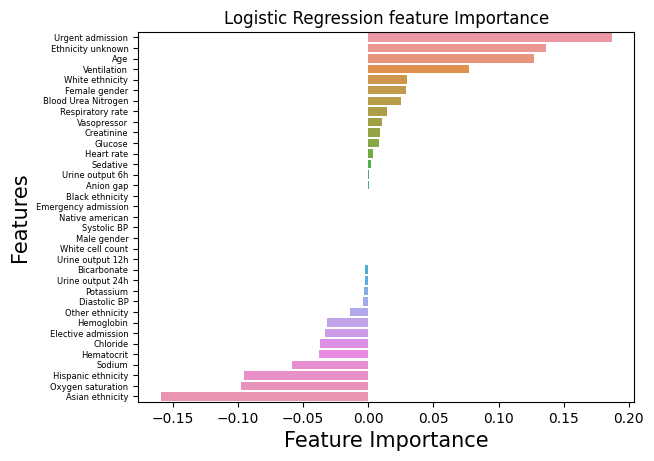

In [100]:
ax = sns.barplot(x='Feature Importance', y='Features', data=logR_df)
ax.set_xlabel('Feature Importance', fontsize = 15)
ax.set_ylabel("Features",fontsize=15)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 6)
plt.title('Logistic Regression feature Importance')
plt.savefig('LogR_feature_importance_sign.png', dpi = 300, bbox_inches='tight')

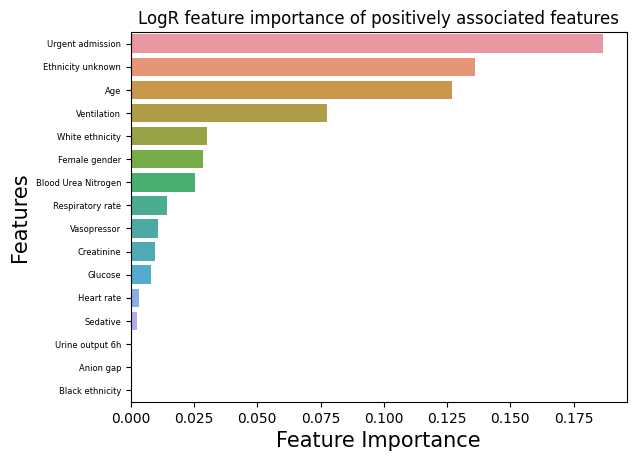

In [101]:
# positive
positiveLogR = logR_df[0:16]
ax = sns.barplot(x='Feature Importance', y='Features', data=positiveLogR)
ax.set_xlabel('Feature Importance', fontsize = 15)
ax.set_ylabel("Features",fontsize=15)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 6)
plt.title('LogR feature importance of positively associated features')
plt.savefig('LogR_feature_importance_pos.png', dpi = 300, bbox_inches='tight')

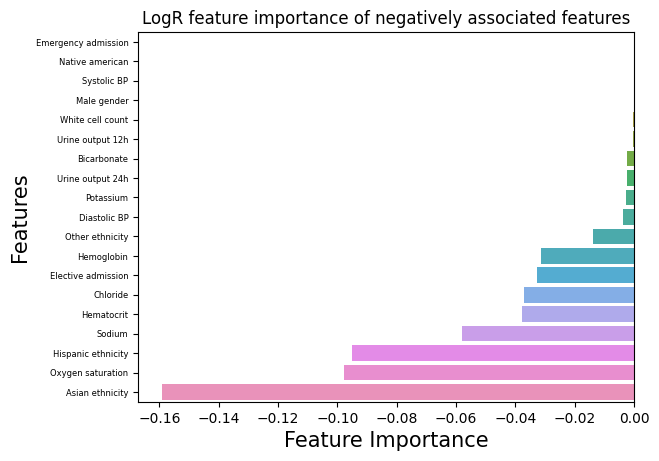

In [102]:
# negative
negativeLogR = logR_df[16:35]
ax = sns.barplot(x='Feature Importance', y='Features', data=negativeLogR)
ax.set_xlabel('Feature Importance', fontsize = 15)
ax.set_ylabel("Features",fontsize=15)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 6)
plt.title('LogR feature importance of negatively associated features')
plt.savefig('LogR_feature_importance_neg.png', dpi = 300, bbox_inches='tight')

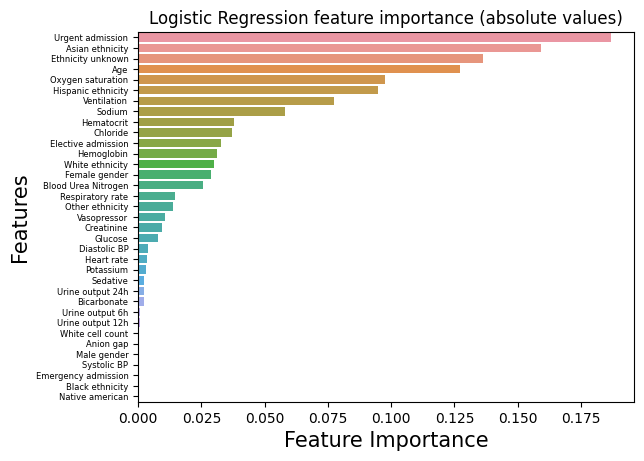

In [103]:
logR_df['abs'] = abs(logR_df['Feature Importance'])
logR_df = logR_df.sort_values(by = ['abs'], ascending = False, ignore_index = True)
ax = sns.barplot(x='abs', y='Features', data=logR_df)
ax.set_xlabel('Feature Importance', fontsize = 15)
ax.set_ylabel("Features",fontsize=15)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 6)
#plt.xlim(0.91, 1.075)
plt.title('Logistic Regression feature importance (absolute values)')
plt.savefig('LogR_feature_importance_absolute.png', dpi = 300, bbox_inches='tight')

In [104]:
logR_df =  pd.DataFrame(logR_feat, columns = ['Feature Importance'])
logR_df['Features'] = variables
logR_df['abs'] = abs(logR_df['Feature Importance'])
logR_df = logR_df.sort_values(by = ['abs'], ascending = False, ignore_index = True)
logR_df_10 = logR_df.head(10)
#logR_df_10


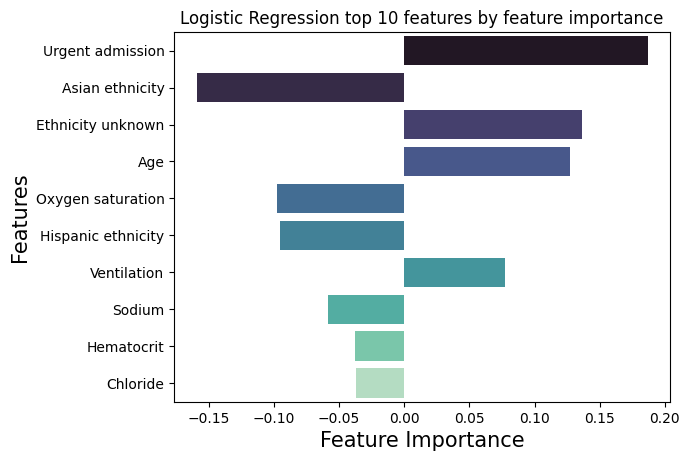

In [105]:
ax = sns.barplot(x='Feature Importance', y='Features', data=logR_df_10, palette="mako")
ax.set_xlabel('Feature Importance', fontsize = 15)
ax.set_ylabel("Features",fontsize=15)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 10)
plt.title('Logistic Regression top 10 features by feature importance')
plt.savefig('LogR_top10_feature_importance.png', dpi = 300, bbox_inches='tight')

 # LogR shap

In [127]:
# load JS visualization code to notebook
shap.initjs()
# explain the model's predictions using SHAP
lr_explainer = shap.LinearExplainer(model_LR1,X_test, feature_perturbation="interventional")
lr_shap_values = lr_explainer.shap_values(X_test)

The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, or maskers.Impute)


# Calculate mean values

In [128]:
def mean_over_timestamps(n, shap_values, X):
    # shap table columns: 22 numeric features * 133 timestamps + 13 categorical features
    # only include non-padded data into mean calculation
    a = []
    b = []
    i = 0
    f = 0
    # first calculate dynamic features
    while f < 22:
        temp_a = 0 # sum of a feature shap
        temp_b = 0 # sum of feature value
        i = i + f # ith column, fth feature
        counter = 0 # current timestamp
        while counter < 133: # max iteration 133
            temp_a += shap_values[n][i]
            temp_b += X[n][i]
            i += 22
            counter += 1
            # check if is padded data
            if np.any(X[n][i:i+22]):
                continue
            else:
                break
        a.append(temp_a/counter) #mean shap
        b.append(temp_b/counter) #mean feature
        i = 0
        f += 1
    # add static features
    a.extend(shap_values[n][-13:])
    b.extend(X[n][-13:])
    a = np.array(a).reshape((1,-1))
    b = np.array(b).reshape((1,-1))
    return a, b        

In [129]:
# for the first istance
lr_shap_mean, lr_X_mean = mean_over_timestamps(0, lr_shap_values, X_test)
n = 1
while n < X_test.shape[0]:
    a,b = mean_over_timestamps(n, lr_shap_values, X_test)
    n += 1
    lr_shap_mean = np.concatenate((lr_shap_mean, a), axis = 0)
    lr_X_mean = np.concatenate((lr_X_mean, b), axis = 0)

In [130]:
lr_X_mean = pd.DataFrame(lr_X_mean, columns= variables)

In [131]:
single_shap_lr = lr_shap_mean[2,:]
single_X_lr = lr_X_mean[2:3]
# visualize single prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(lr_explainer.expected_value, single_shap_lr, single_X_lr)

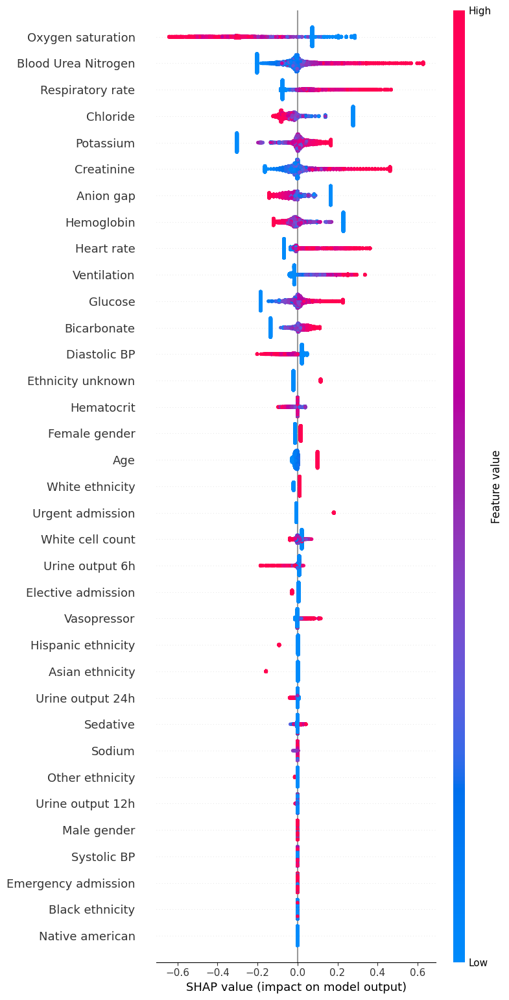

<Figure size 640x480 with 0 Axes>

In [132]:
# summarize the effects of all the features
shap.summary_plot(lr_shap_mean, lr_X_mean,max_display=X_test.shape[1])
plt.savefig('LogR_shap summary.png', dpi = 300, bbox_inches='tight')

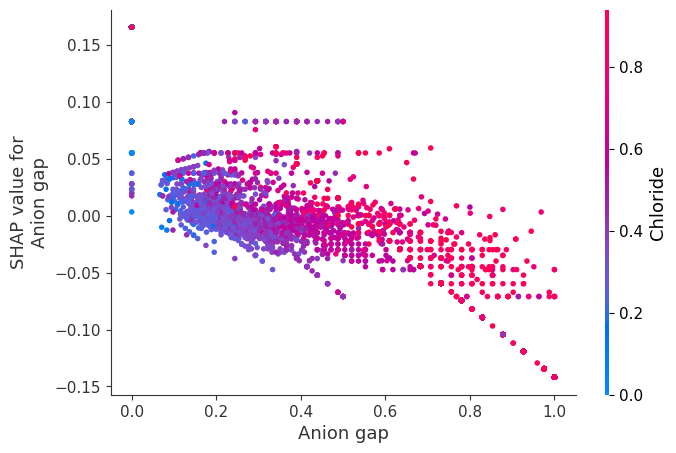

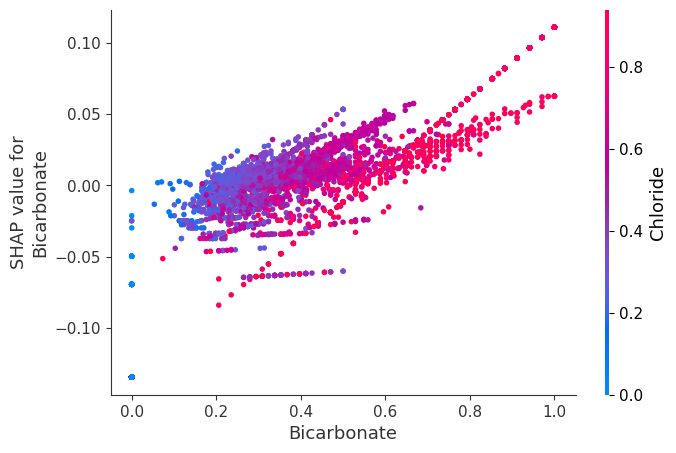

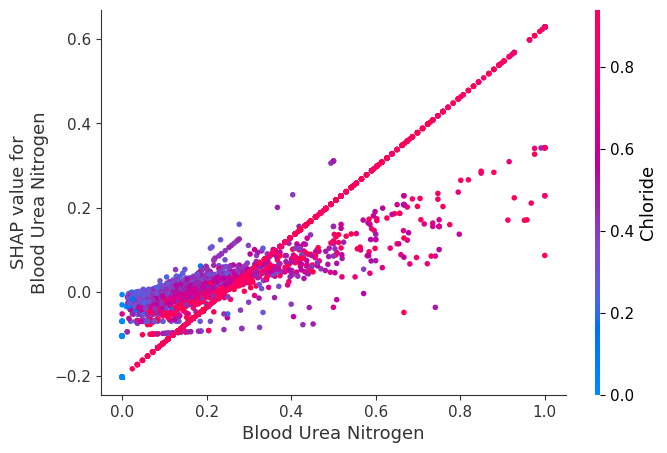

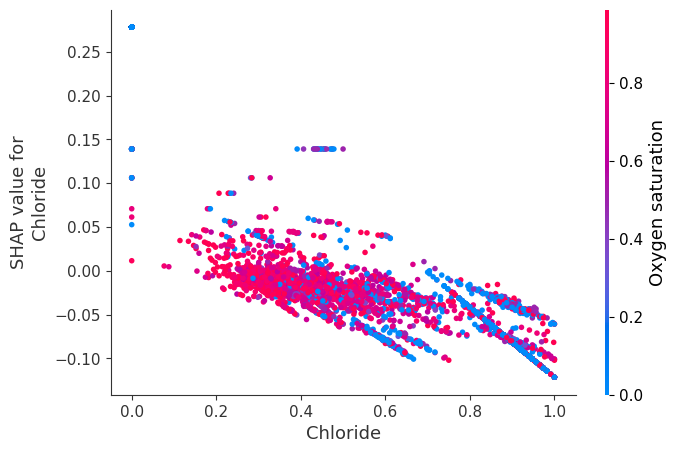

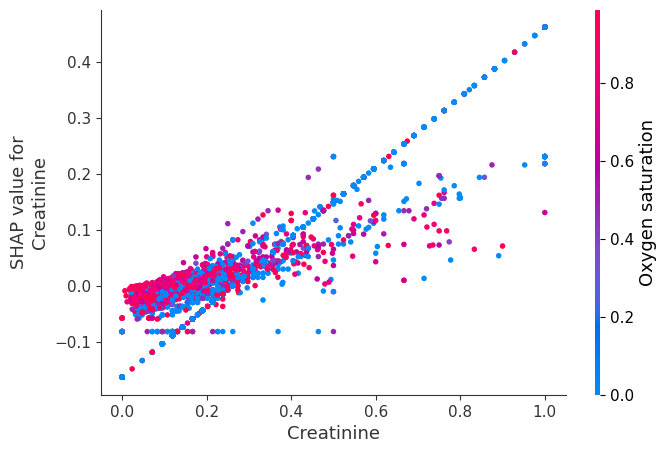

...

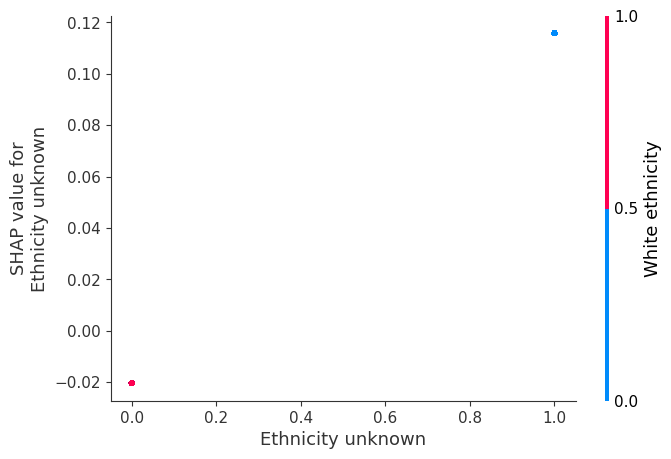

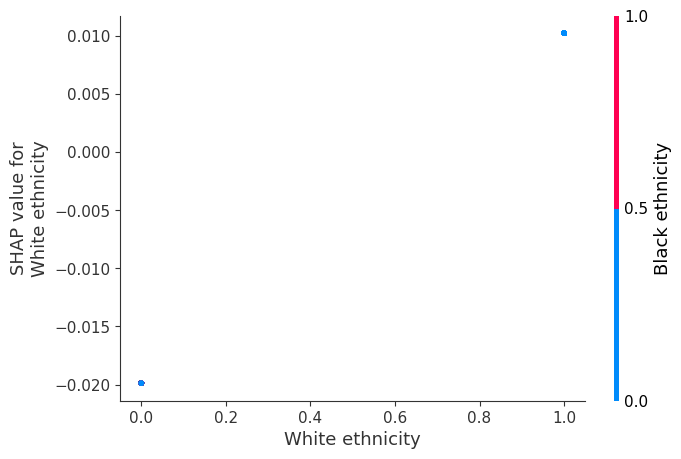

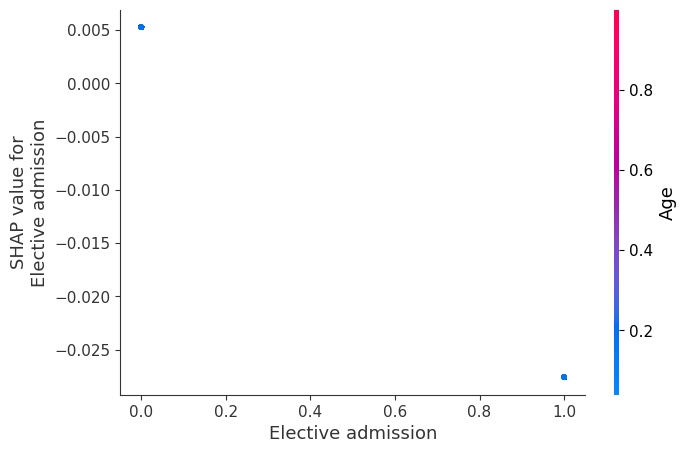

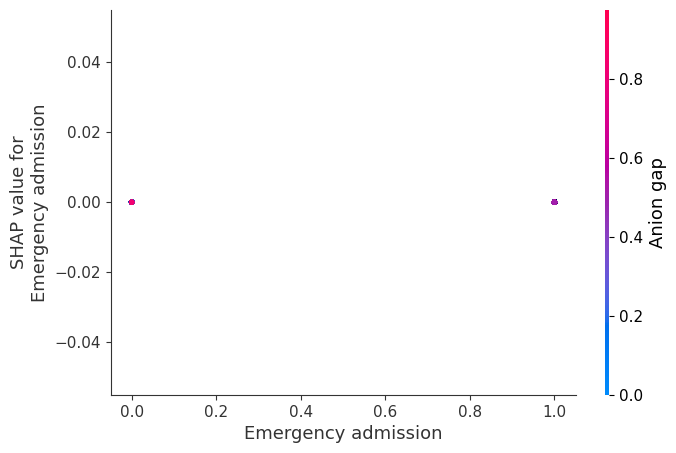

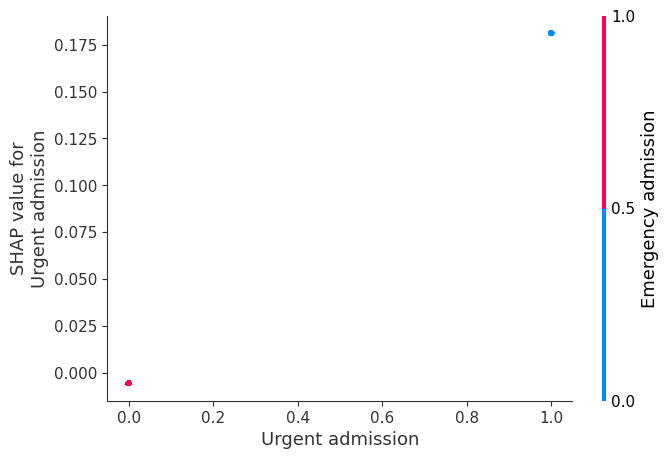

In [133]:
# dependence plot with interaction
for i in variables:
     shap.dependence_plot(i, lr_shap_mean, lr_X_mean)

# XGB model

In [ ]:
counter=collections.Counter(y_train)
SCALE_POS_WEIGHT = round(counter[0]/counter[1],1)

In [ ]:
print("build GBT")
#build gradient boost model
xgb_model = xgb.XGBClassifier(
 learning_rate = 0.1,
 n_estimators= 70,
 max_depth= 7,
 min_child_weight= 3,
 gamma= 0.5,
 subsample= 0.8,
 colsample_bytree= 0.8,
 objective= 'binary:logistic',
 nthread= 4,
 scale_pos_weight= SCALE_POS_WEIGHT,
 seed= 42)

print("train GBT")
# train xgb
xgb_model.fit(X_train, y_train, 
                early_stopping_rounds= 40, 
                eval_metric= ["auc", "error", "logloss"], 
                eval_set= [(X_test, y_test)],
                verbose= False)
joblib.dump(xgb_model, 'xgb_model.joblib')

print("predictions after tuning")
#Make predictions 
GBT_pred = xgb_model.predict(X_test)
GBT_probs = xgb_model.predict_proba(X_test)[::,1]

In [93]:
performance(y_test,GBT_probs)
'''
No imp

Area Under ROC Curve: 0.92
Brier score : 0.108
 
 With imp
Area Under ROC Curve: 0.91
Brier score : 0.120


NEW DATASET NO IMP
Area Under ROC Curve: 0.91
Brier score : 0.115
 '''

Area Under ROC Curve: 0.91
Brier score : 0.115


'\nNo imp\n\nArea Under ROC Curve: 0.92\nBrier score : 0.108\n \n With imp\nArea Under ROC Curve: 0.91\nBrier score : 0.120\n\n\nNEW DATASET NO IMP\nArea Under ROC Curve: 0.91\nBrier score : 0.115\n '

# XGB feature importance

In [106]:
# reshape to timestamps x features
xgb_feat = xgb_model.feature_importances_
print(xgb_feat)
xgb_feat_dynamic = np.reshape(xgb_feat[:-13],(timestamps,-1)) # shape 133, 22
# sum the feature importance by feature
xgb_feat_dynamic = xgb_feat_dynamic.sum(axis = 0)
# get feature importance of static features
xgb_feat_static = xgb_feat[-13:]
xgb_feat = np.concatenate((xgb_feat_dynamic, xgb_feat_static), axis = None)

[0.00032369 0.00039426 0.00111867 ... 0.00073665 0.00035094 0.00022977]


In [107]:
xgb_df =  pd.DataFrame(xgb_feat, columns = ['Feature Importance'])
xgb_df['Features'] = variables
#xgb_df = xgb_df.set_index('Features')
xgb_df = xgb_df.sort_values(by = ['Feature Importance'], ascending = False, ignore_index = True)
#xgb_df

Text(0.5, 1.0, 'XGBoost feature Importance')

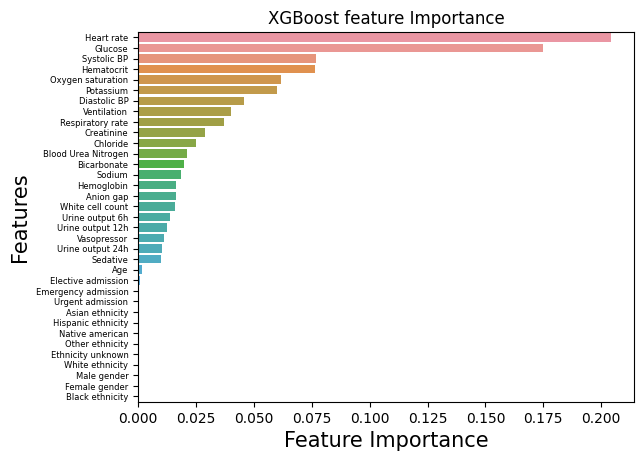

In [115]:
ax = sns.barplot(x='Feature Importance', y='Features', data=xgb_df)
ax.set_xlabel('Feature Importance', fontsize = 15)
ax.set_ylabel("Features",fontsize=15)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 6)
plt.title('XGBoost feature Importance')
#plt.savefig('XGB_feature_importance.png', dpi = 300, bbox_inches='tight')

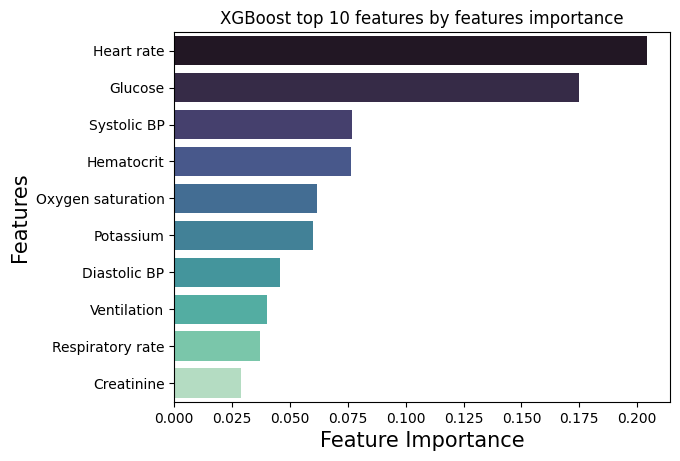

In [109]:
xgb_df_10 = xgb_df.head(10)
ax = sns.barplot(x='Feature Importance', y='Features', data=xgb_df_10, palette = 'mako')
ax.set_xlabel('Feature Importance', fontsize = 15)
ax.set_ylabel("Features",fontsize=15)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 10)
plt.title('XGBoost top 10 features by features importance')
plt.savefig('XGB_top10_feature_importance.png', dpi = 300, bbox_inches='tight')

# SHAP

In [110]:
# load JS visualization code to notebook
shap.initjs()
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
xgb_explainer = shap.TreeExplainer(xgb_model)
xgb_shap_values = xgb_explainer.shap_values(X_test)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [111]:
# for the first istance
xgb_shap_mean, xgb_X_mean = mean_over_timestamps(0,xgb_shap_values,X_test)
n = 1
while n < X_test.shape[0]:
    a,b = mean_over_timestamps(n, xgb_shap_values,X_test)
    n+=1
    xgb_shap_mean = np.concatenate((xgb_shap_mean, a), axis=0)
    xgb_X_mean = np.concatenate((xgb_X_mean, b), axis=0)

In [112]:
xgb_X_mean = pd.DataFrame(xgb_X_mean, columns= variables)
single_shap_xgb = xgb_shap_mean[2,:]
single_X_xgb = xgb_X_mean[2:3]
# visualize single prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(xgb_explainer.expected_value, single_shap_xgb, single_X_xgb)

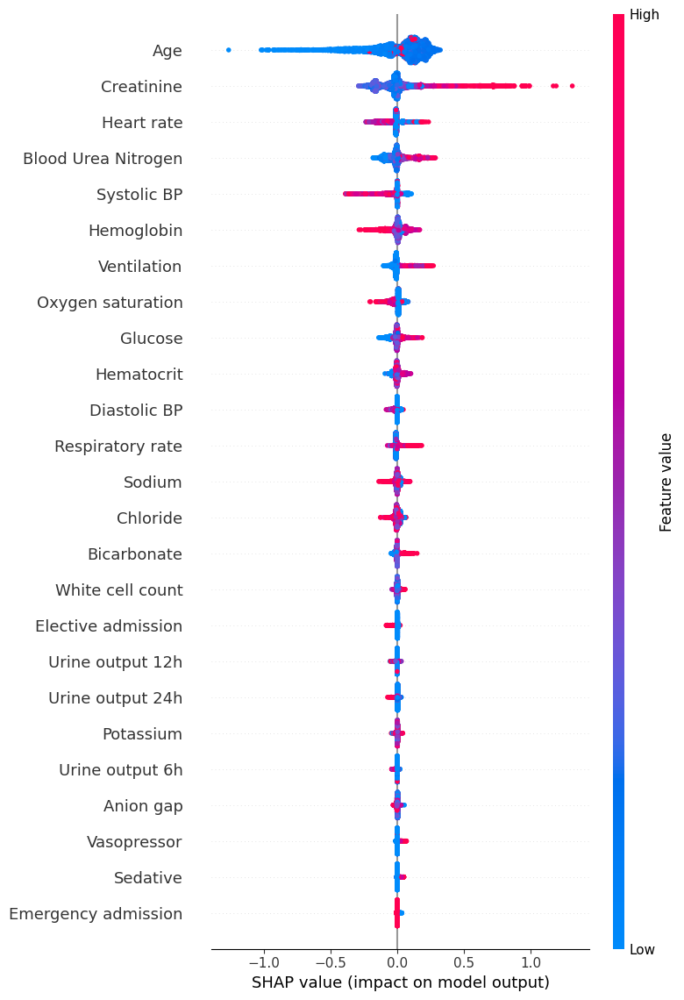

In [113]:
# summarize the effects of all the features
shap.summary_plot(xgb_shap_mean, xgb_X_mean, max_display=X.shape[1])

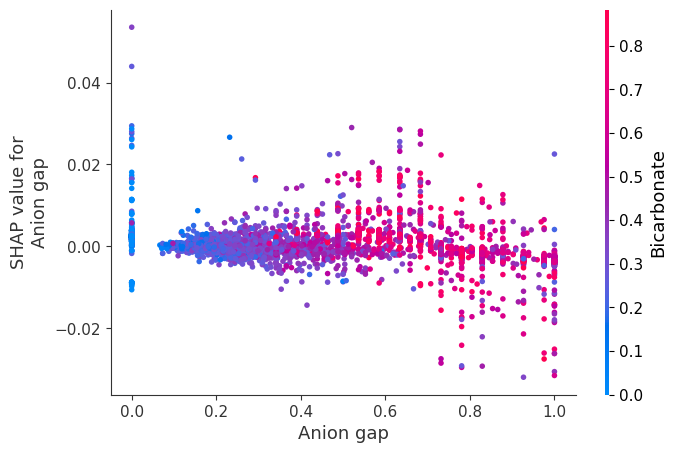

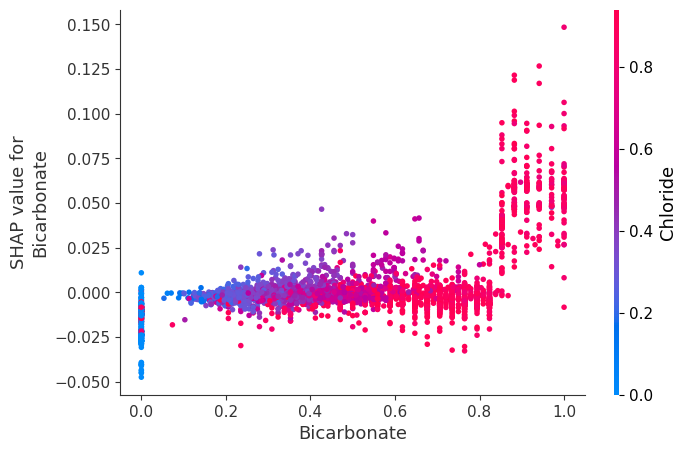

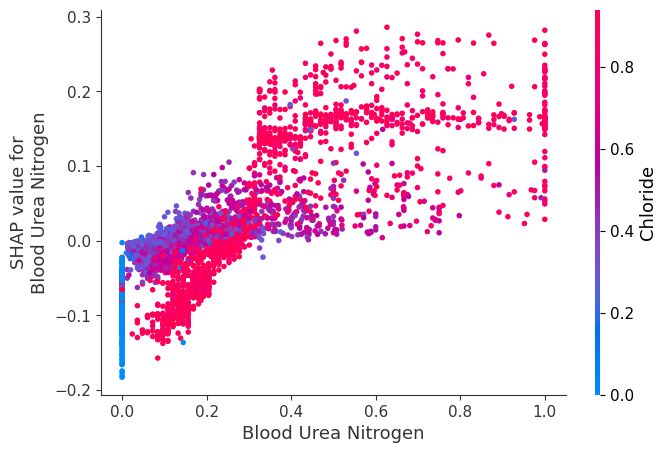

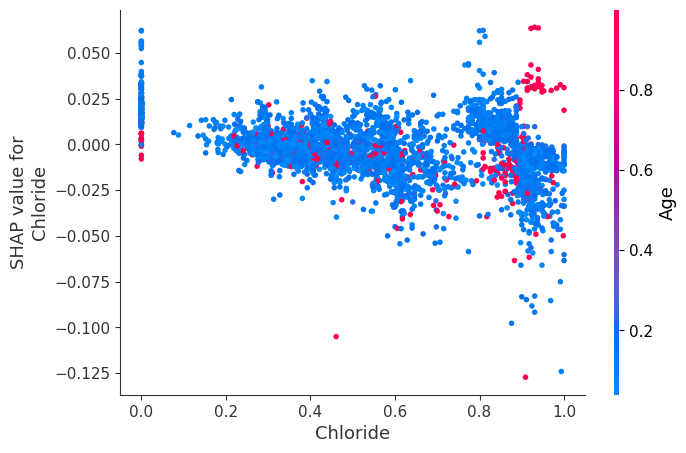

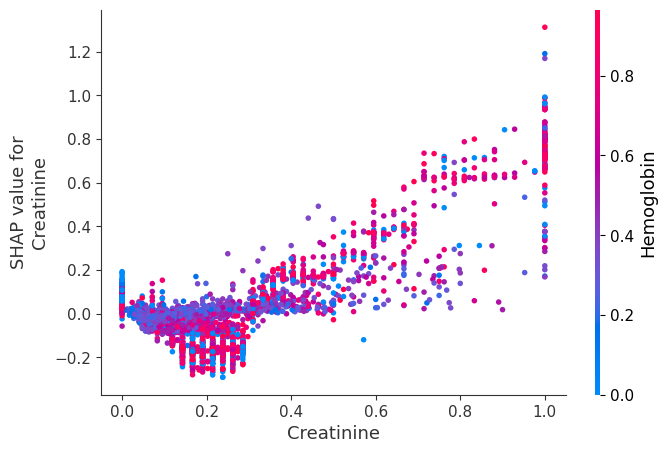

...

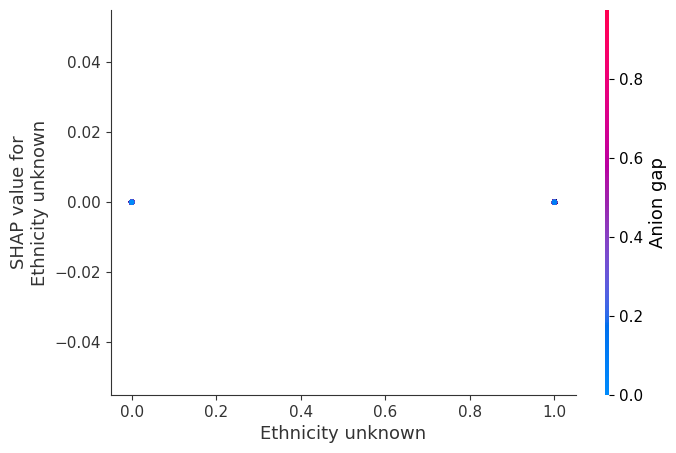

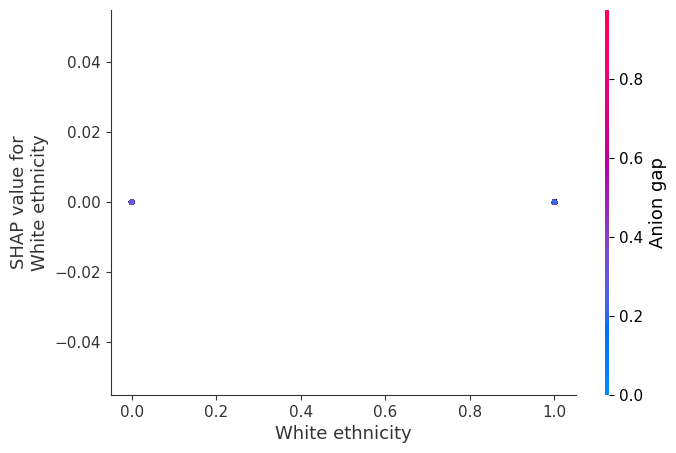

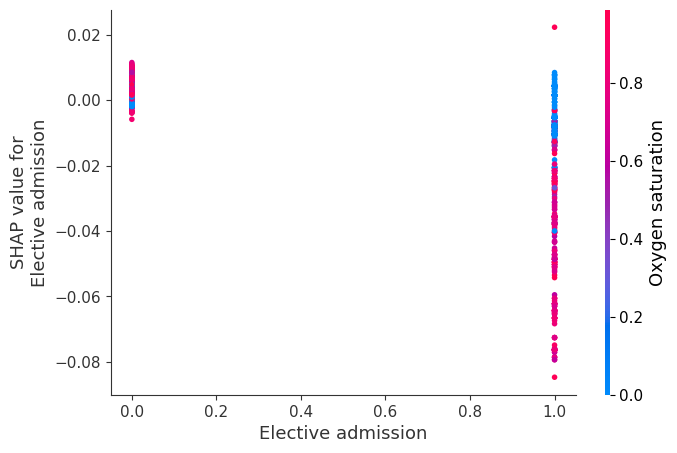

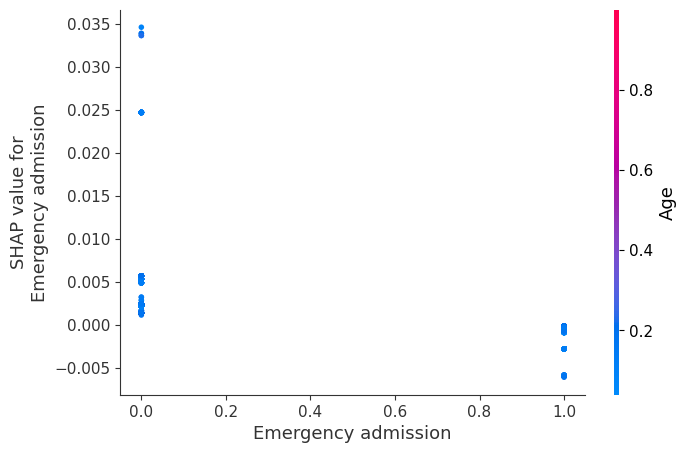

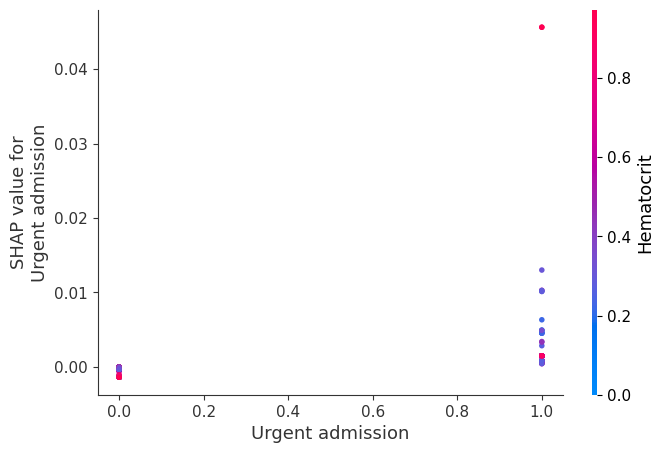

In [114]:
# dependence plot with interaction
for i in variables:
     shap.dependence_plot(i, xgb_shap_mean, xgb_X_mean)

# The Random Forests model

In [ ]:
print("build RF")
# building RF (default parameters)
rf_model = RandomForestClassifier(n_estimators=700,criterion='gini',max_depth=40,min_samples_split=10,min_samples_leaf=2,
                                  min_weight_fraction_leaf=0.0,max_features='auto',max_leaf_nodes=None,
                                  bootstrap=False,oob_score=False,n_jobs=None,random_state=None,verbose=0,warm_start=False,
                                  class_weight=None,ccp_alpha=0.0,max_samples=None)


print("train RF")
# train RF
rf_model.fit(X_train, y_train)
joblib.dump(rf_model, 'rf_model.joblib')

print("predictions")
#Make predictions 
RF_pred = rf_model.predict(X_test)
RF_probs = rf_model.predict_proba(X_test)[::,1] # probability of class 1

In [90]:
performance(y_test,RF_probs)
'''
No Imp

Area Under ROC Curve: 0.93
Brier score : 0.105

With imp
Area Under ROC Curve: 0.89
Brier score : 0.133


NEW DATASET NO IMP
Area Under ROC Curve: 0.92
Brier score : 0.109
 '''

Area Under ROC Curve: 0.92
Brier score : 0.109


'\nNo Imp\n\nArea Under ROC Curve: 0.93\nBrier score : 0.105\n\nWith imp\nArea Under ROC Curve: 0.89\nBrier score : 0.133\n\n\nNEW DATASET NO IMP\nArea Under ROC Curve: 0.92\nBrier score : 0.109\n '

# RF feature importance

In [94]:
# reshape to timestamps x features
rf_feat = rf_model.feature_importances_
print(rf_feat.shape)
rf_feat_dynamic = np.reshape(rf_feat[:-13],(timestamps,-1)) # shape 133, 22
# sum the feature importance by feature
rf_feat_dynamic = rf_feat_dynamic.sum(axis = 0)
# get feature importance of static features
rf_feat_static = rf_feat[-13:]
rf_feat = np.concatenate((rf_feat_dynamic, rf_feat_static), axis = None)

(2939,)


In [95]:
rf_df =  pd.DataFrame(rf_feat, columns = ['Feature Importance'])
rf_df['Features'] = variables
#rf_df = rf_df.set_index('Features')
rf_df = rf_df.sort_values(by = ['Feature Importance'], ascending = False, ignore_index = True)
#rf_df

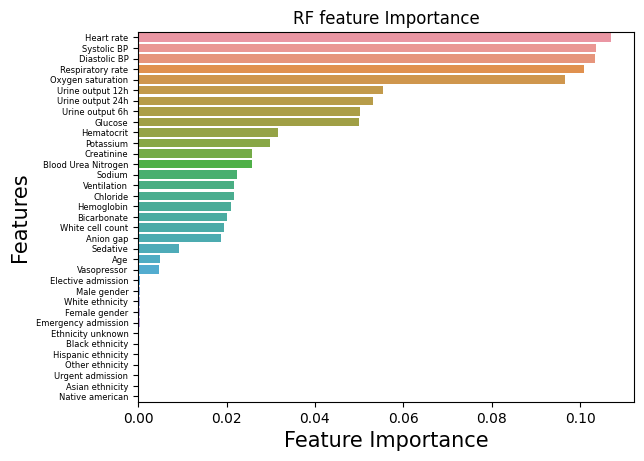

In [96]:
ax = sns.barplot(x='Feature Importance', y='Features', data=rf_df)
ax.set_xlabel('Feature Importance', fontsize = 15)
ax.set_ylabel("Features",fontsize=15)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 6)
plt.title('RF feature Importance')
plt.savefig('RF_feature_importance.png', dpi = 300, bbox_inches='tight')

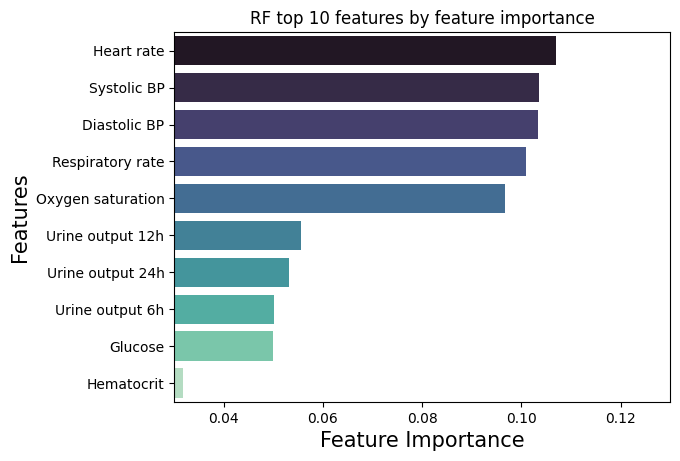

In [97]:
rf_df_10 = rf_df.head(10)
ax = sns.barplot(x='Feature Importance', y='Features', data=rf_df_10, palette = 'mako')
ax.set_xlabel('Feature Importance', fontsize = 15)
ax.set_ylabel("Features",fontsize=15)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 10)
plt.xlim(0.03, 0.13)
plt.title('RF top 10 features by feature importance')
plt.savefig('RF_top10_feature_importance.png', dpi = 300, bbox_inches='tight')

# Shap

In [116]:
# load JS visualization code to notebook
shap.initjs()
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
rf_explainer = shap.TreeExplainer(rf_model)
rf_shap_values = rf_explainer.shap_values(X_test)

In [122]:
def mean_over_timestamps_rf(n, shap_values, X):
    # only include non-padded data into mean calculation
    a = []
    b = []
    i = 0
    f = 0
    # first calculate dynamic features
    while f < 22:
        temp_a = 0 # sum of a feature shap
        temp_b = 0 # sum of feature value
        i = i + f # ith column, fth feature
        counter = 0 # current timestamp
        while counter < 133: # max iteration 133
            temp_a += shap_values[n][i]
            temp_b += X[n][i]
            i += 22
            counter += 1
            # decide if it is padded data
            if np.any(X[n][i:i+22]):
                continue
            else:
                break
        a.append(temp_a/counter) #mean shap
        b.append(temp_b/counter) #mean feature
        i = 0
        f += 1
    # add static features
    a.extend(shap_values[n][-13:])
    b.extend(X[n][-13:])
    a = np.array(a).reshape((1,-1))
    b = np.array(b).reshape((1,-1))
    return a, b        

In [123]:
# for the first istance
rf_shap_mean, rf_X_mean = mean_over_timestamps(0,rf_shap_values[1],X_test)
n = 1
while n < X_test.shape[0]:
    a,b = mean_over_timestamps(n, rf_shap_values[1],X_test)
    n+=1
    rf_shap_mean = np.concatenate((rf_shap_mean, a), axis=0)
    rf_X_mean = np.concatenate((rf_X_mean, b), axis=0)

In [124]:
rf_X_mean = pd.DataFrame(rf_X_mean, columns= variables)
single_shap_rf = rf_shap_mean[2,:]
single_X_rf = rf_X_mean[2:3]
# visualize single prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(rf_explainer.expected_value[1], single_shap_rf, single_X_rf)

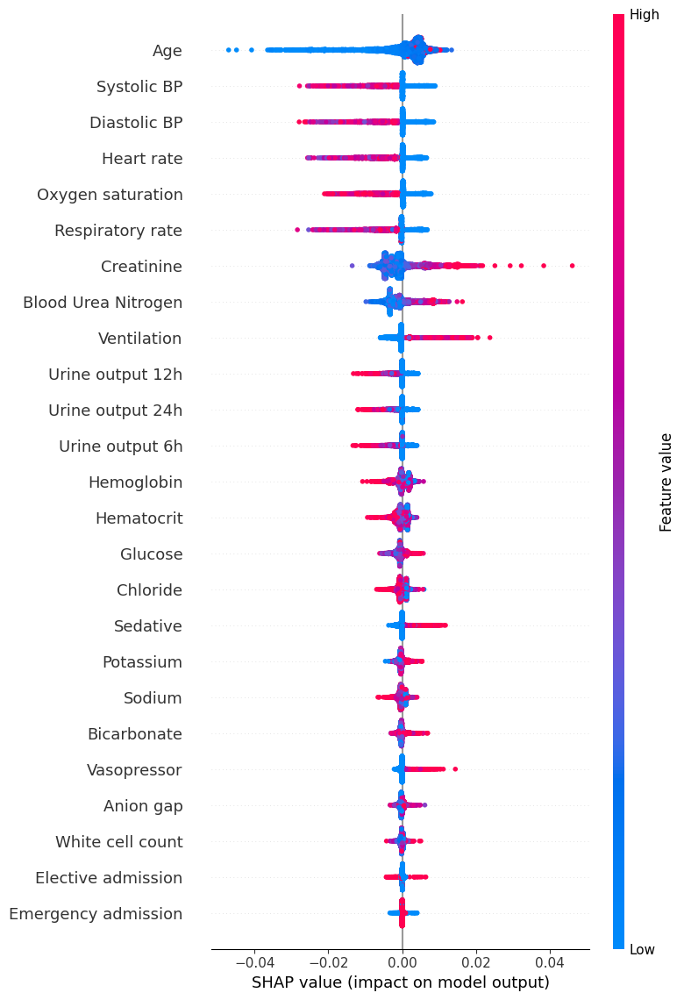

In [125]:
# summarize the effects of all the features
shap.summary_plot(rf_shap_mean, rf_X_mean, max_display=X.shape[1])

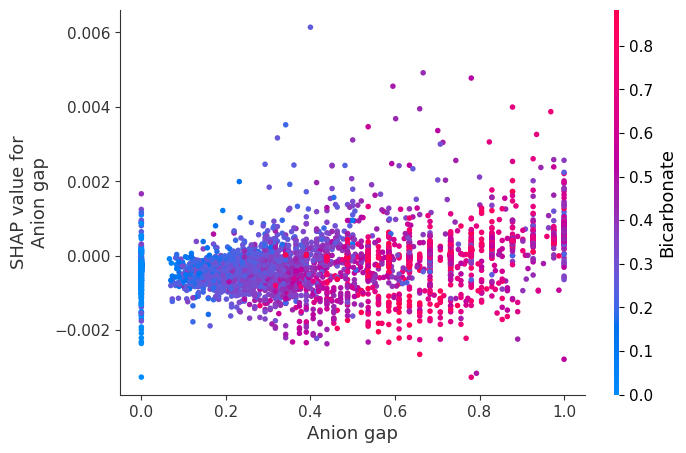

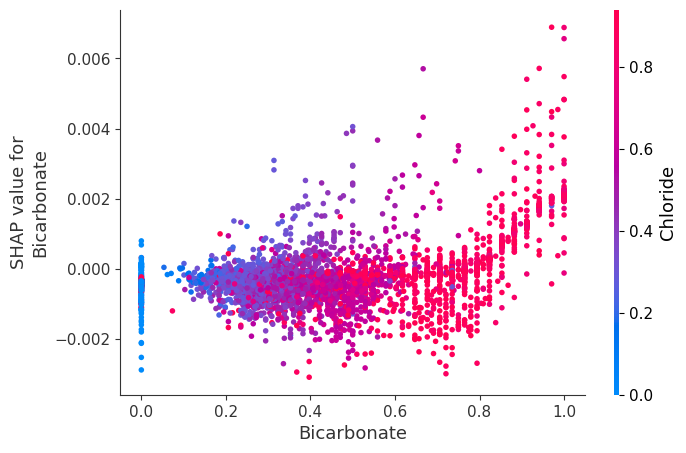

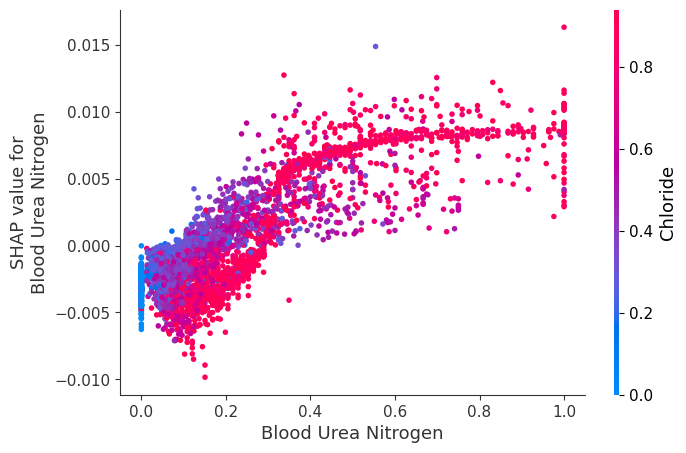

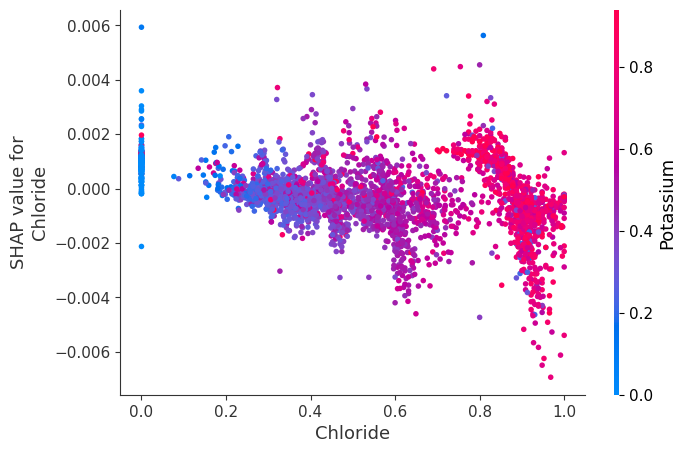

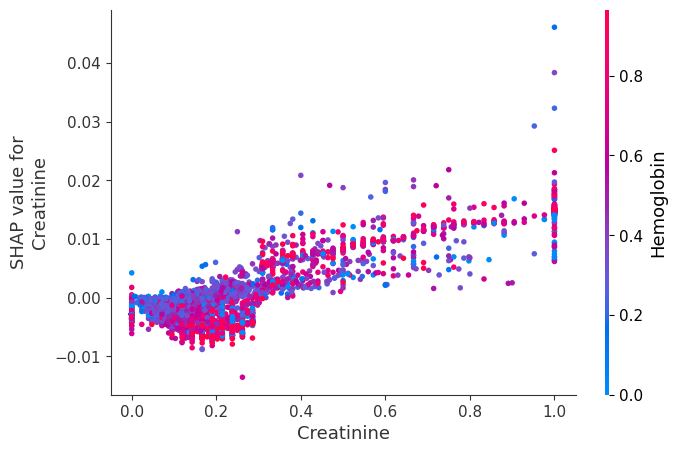

...

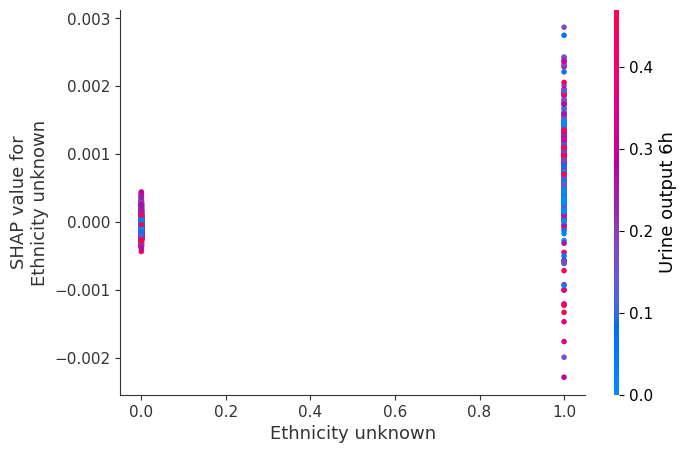

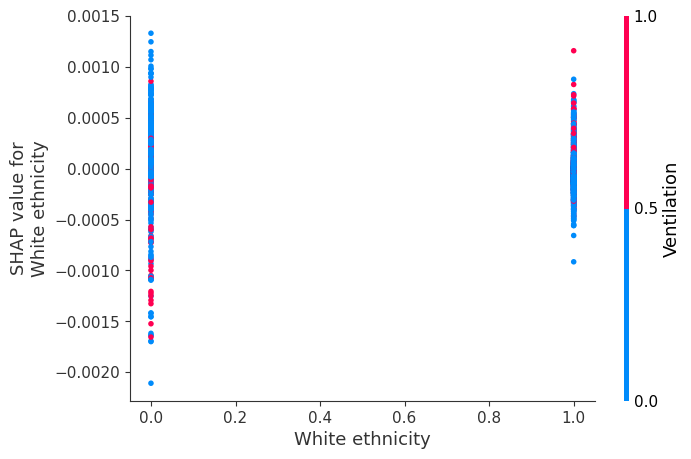

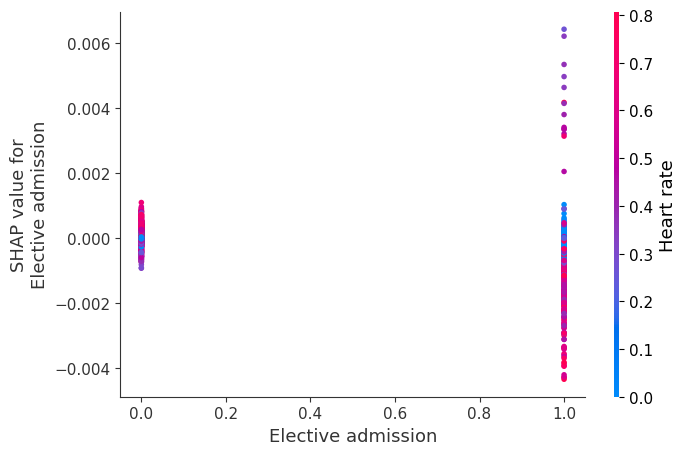

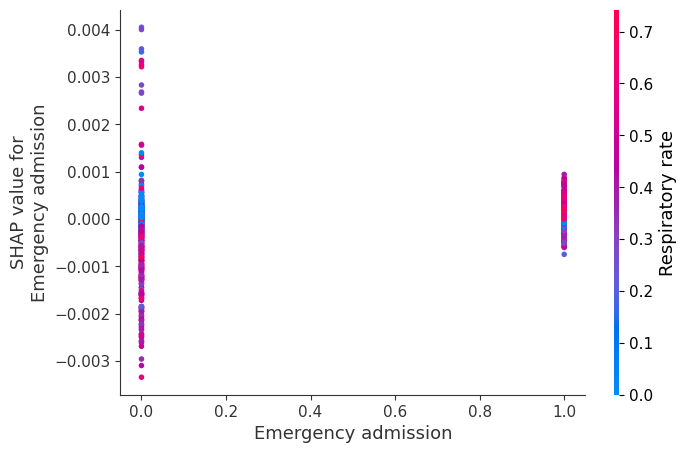

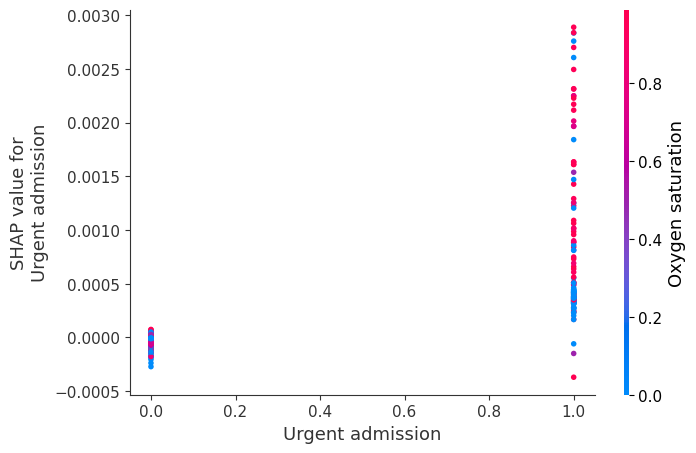

In [126]:
# dependence plot with interaction
for i in variables:
     shap.dependence_plot(i, rf_shap_mean, rf_X_mean)

# calibration together (for previous study)

In [51]:
def calibration_together (y_test,x1, x2,x3,x4, plot_name):
    
    # performance
    #fpr, tpr, thresholds = roc_curve(y1, pred_probabilities)
    # compute roc auc
    #roc_auc = roc_auc_score(y1, pred_probabilities, average = 'micro')
    

    # compute calibration curve
    y, x = calibration_curve(y_test, x1, n_bins=10)
    #find out which one are the missing bins
    bin_array = bin_total(y, x1 , n_bins=10)


    print("plot curves and save in one png file")
    #save three plots in one png file
    fig, (ax1) = plt.subplots(1, figsize=(7, 7))
    fig.subplots_adjust(wspace=0.3, hspace= 0.3)
    
    # plot calibration curve LR
    ax1.plot(x, y, 'C2',marker='o', linewidth=1, label='LogR')
    line = mlines.Line2D([0, 1], [0, 1], color='black')
    transform = ax1.transAxes
    line.set_transform(transform)
    ax1.add_line(line)
    ax1.title.set_text(str(plot_name))
    ax1.set(xlabel= 'Predicted probability', ylabel= 'True probability in each bin')
    ax1.legend(loc="lower right")

    # plot calibration curve XGBoost
    y, x2 = calibration_curve(y_test, x2, n_bins=10)
    #find out which one are the missing bins
    bin_array2 = bin_total(y, x2 , n_bins=10)
    ax1.plot(x2, y, 'C3',marker='o', linewidth=1, label='XGBoost')
    ax1.add_line(line)
    ax1.legend(loc="lower right")
    
    # plot calibration curve RF
    y, x3 = calibration_curve(y_test, x3, n_bins=10)
    #find out which one are the missing bins
    bin_array3 = bin_total(y, x3 , n_bins=10)
    ax1.plot(x3, y, 'C4',marker='o', linewidth=1, label='RF')
    ax1.add_line(line)
    ax1.legend(loc="lower right")
    
    # plot calibration curve LSTM
    y, x4 = calibration_curve(y_test, x4, n_bins=10)
    #find out which one are the missing bins
    bin_array4 = bin_total(y, x4 , n_bins=10)
    ax1.plot(x4, y, 'C5',marker='o', linewidth=1, label='LSTM')
    ax1.add_line(line)
    ax1.legend(loc="lower right")
    
    

    
    #plt.savefig(plot_name+".png")
    plt.show()
    
y_LR = y_test
y_XGB = y_test
y_RF = y_test
with open('test.npy', 'rb') as f:
    #y_lstm = np.load(f)
    lstm_prob = np.load(f)

plot curves and save in one png file


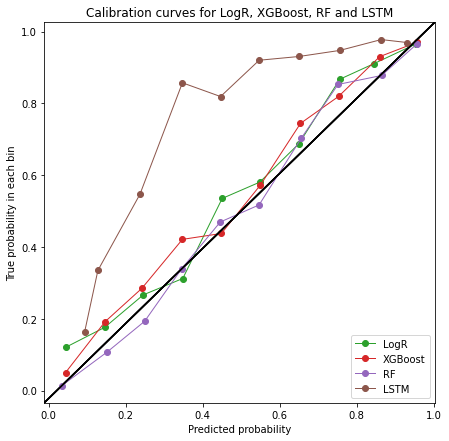

In [52]:
calibration_together(y_test,LR1_probs,GBT_probs,RF_probs,lstm_prob,  "Calibration curves for LogR, XGBoost, RF and LSTM")


In [53]:
def dist_together (x1,x2, x3,x4, plot_name):

    fig, ( ax2) = plt.subplots(1, figsize=(7, 7))
    fig.subplots_adjust(wspace=0.3, hspace= 0.3)
    
    # working
    ax2.title.set_text(str(plot_name))
    ax2.hist(x1, color = "green",range=(0, 1), bins=10,label="LogR", histtype="step", lw=2)
    ax2.hist(x2, color = "red", range=(0, 1), bins= 10, label="XGBoost", histtype="step", lw=2)
    ax2.hist(x3, color = "purple", range=(0, 1), bins= 10, label="RF", histtype="step", lw=2)
    ax2.hist(x4, color = "brown", range=(0, 1), bins= 10, label="LSTM", histtype="step", lw=2)
    ax2.set(xlabel= 'Mean predicted value', ylabel= 'Count')
    ax2.legend(loc="upper center")
    
    plt.savefig(plot_name+".png")
    plt.show()
    


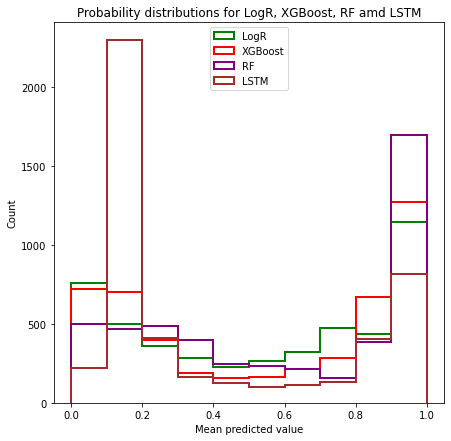

In [54]:
dist_together (LR1_probs,GBT_probs,RF_probs,lstm_prob,  "Probability distributions for LogR, XGBoost, RF amd LSTM")


# for the paper

In [82]:
def calibration_together (y_test,x3,x4,plot_name):
  
    #save three plots in one png file
    fig, (ax1) = plt.subplots(1, figsize=(7, 7))
    fig.subplots_adjust(wspace=0.3, hspace= 0.3)
    
    
    line = mlines.Line2D([0, 1], [0, 1], color='black')
    transform = ax1.transAxes
    line.set_transform(transform)
    ax1.add_line(line)
    ax1.title.set_text(str(plot_name))
    ax1.set(xlabel= 'Predicted probability', ylabel= 'True probability in each bin')
    #ax1.legend(loc="lower right")

    
    # plot calibration curve RF
    y, x3 = calibration_curve(y_test, x3, n_bins=10)
    #find out which one are the missing bins
    bin_array3 = bin_total(y, x3 , n_bins=10)
    ax1.plot(x3, y, 'C4',marker='o', linewidth=1, label='RF')
    ax1.add_line(line)
    ax1.legend(loc="lower right")
    
    # plot calibration curve LSTM
    y, x4 = calibration_curve(y_test, x4, n_bins=10)
    #find out which one are the missing bins
    bin_array4 = bin_total(y, x4 , n_bins=10)
    ax1.plot(x4, y, 'C5',marker='o', linewidth=1, label='LSTM')
    ax1.add_line(line)
    ax1.legend(loc="lower right")
    

    
    plt.savefig(plot_name+".png")
    plt.show()
    

with open('test.npy', 'rb') as f:
    lstm_prob = np.load(f)

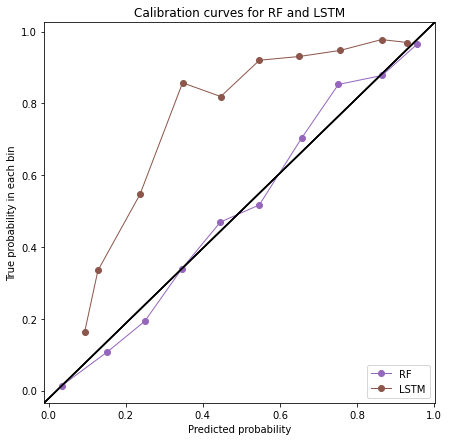

In [63]:
calibration_together(y_test,RF_probs,lstm_prob, "Calibration curves for RF and LSTM")

In [64]:
def dist_together (x3,x4, plot_name):

    fig, ( ax2) = plt.subplots(1, figsize=(7, 7))
    fig.subplots_adjust(wspace=0.3, hspace= 0.3)
    
    # working
    ax2.title.set_text(str(plot_name))
    ax2.hist(x3, color = "purple", range=(0, 1), bins= 10, label="RF", histtype="step", lw=2)
    ax2.hist(x4, color = "brown", range=(0, 1), bins= 10, label="LSTM", histtype="step", lw=2)
    ax2.set(xlabel= 'Mean predicted value', ylabel= 'Count')
    ax2.legend(loc="upper center")
    
    plt.savefig(plot_name+".png")
    plt.show()
    


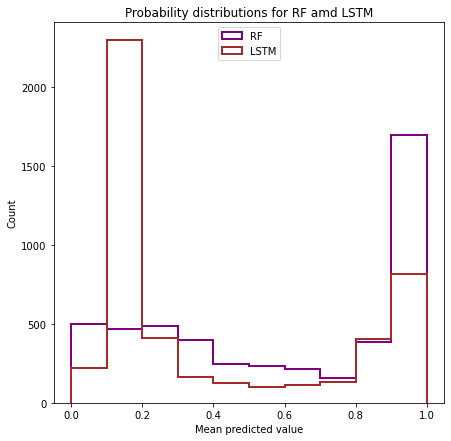

In [65]:
dist_together (RF_probs,lstm_prob, "Probability distributions for RF amd LSTM")


In [80]:
with open('padded_lstm.npy', 'rb') as f:
    c_lstm_labels = np.load(f)
    c_lstm_prob = np.load(f)
    


In [89]:
def calibration_together (y_test,x1, x2,x3,x4, y5, x5, plot_name):
    
    # compute calibration curve
    y, x = calibration_curve(y_test, x1, n_bins=10)
    #find out which one are the missing bins
    bin_array = bin_total(y, x1 , n_bins=10)


    print("plot curves and save in one png file")
    #save three plots in one png file
    fig, (ax1) = plt.subplots(1, figsize=(7, 7))
    fig.subplots_adjust(wspace=0.3, hspace= 0.3)
    
    # plot calibration curve LR
    ax1.plot(x, y, 'C2',marker='o', linewidth=1, label='LogR')
    line = mlines.Line2D([0, 1], [0, 1], color='black')
    transform = ax1.transAxes
    line.set_transform(transform)
    ax1.add_line(line)
    ax1.title.set_text(str(plot_name))
    ax1.set(xlabel= 'Predicted probability', ylabel= 'True probability in each bin')
    ax1.legend(loc="lower right")

    # plot calibration curve XGBoost
    y, x2 = calibration_curve(y_test, x2, n_bins=10)
    #find out which one are the missing bins
    bin_array2 = bin_total(y, x2 , n_bins=10)
    ax1.plot(x2, y, 'C3',marker='o', linewidth=1, label='XGBoost')
    ax1.add_line(line)
    ax1.legend(loc="lower right")
    
    # plot calibration curve RF
    y, x3 = calibration_curve(y_test, x3, n_bins=10)
    #find out which one are the missing bins
    bin_array3 = bin_total(y, x3 , n_bins=10)
    ax1.plot(x3, y, 'C4',marker='o', linewidth=1, label='RF')
    ax1.add_line(line)
    ax1.legend(loc="lower right")
    
    # plot calibration curve LSTM
    y, x4 = calibration_curve(y_test, x4, n_bins=10)
    #find out which one are the missing bins
    bin_array4 = bin_total(y, x4 , n_bins=10)
    ax1.plot(x4, y, 'C0',marker='o', linewidth=1, label='LSTM before onset')
    ax1.add_line(line)
    ax1.legend(loc="lower right")
    
    
    # plot calibration curve LSTM continuous
    y5, x5 = calibration_curve(y5, x5, n_bins=10)
    #find out which one are the missing bins
    bin_array5 = bin_total(y5, x5 , n_bins=10)
    ax1.plot(x5, y, 'C6',marker='o', linewidth=1, label='continuous LSTM')
    ax1.add_line(line)
    ax1.legend(loc="lower right")
    
    
    
    plt.savefig(plot_name+".png")
    plt.show()
    
y_LR = y_test
y_XGB = y_test
y_RF = y_test
with open('test.npy', 'rb') as f:
    #y_lstm = np.load(f)
    lstm_prob = np.load(f)

plot curves and save in one png file


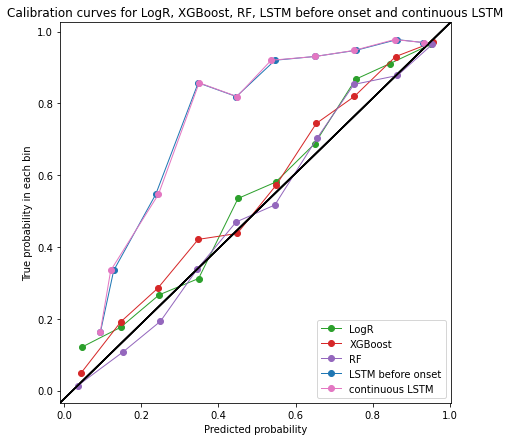

In [90]:
calibration_together(y_test,LR1_probs,GBT_probs,RF_probs,lstm_prob, c_lstm_labels,c_lstm_prob, "Calibration curves for LogR, XGBoost, RF, LSTM before onset and continuous LSTM")




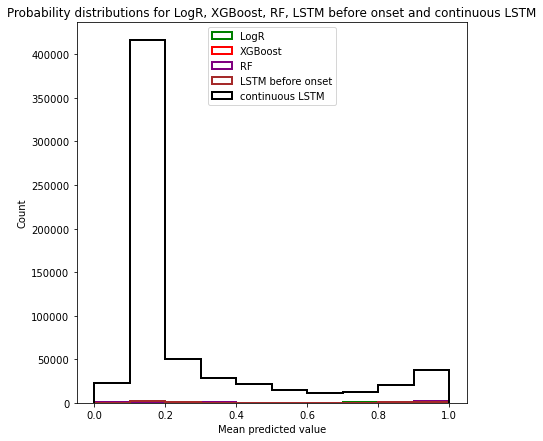

In [91]:
def dist_together (x1,x2, x3,x4, x5, plot_name):

    fig, ( ax2) = plt.subplots(1, figsize=(7, 7))
    fig.subplots_adjust(wspace=0.3, hspace= 0.3)
    
    # working
    ax2.title.set_text(str(plot_name))
    ax2.hist(x1, color = "green",range=(0, 1), bins=10,label="LogR", histtype="step", lw=2)
    ax2.hist(x2, color = "red", range=(0, 1), bins= 10, label="XGBoost", histtype="step", lw=2)
    ax2.hist(x3, color = "purple", range=(0, 1), bins= 10, label="RF", histtype="step", lw=2)
    ax2.hist(x4, color = "brown", range=(0, 1), bins= 10, label="LSTM before onset", histtype="step", lw=2)
    ax2.hist(x5, color = "black", range=(0, 1), bins= 10, label="continuous LSTM", histtype="step", lw=2)
    ax2.set(xlabel= 'Mean predicted value', ylabel= 'Count')
    ax2.legend(loc="upper center")
    
    plt.savefig(plot_name+".png")
    plt.show()
    
dist_together (LR1_probs,GBT_probs,RF_probs,lstm_prob, c_lstm_prob, "Probability distributions for LogR, XGBoost, RF, LSTM before onset and continuous LSTM")


# Individual graphs

In [88]:
import joblib

model_LR1 = joblib.load('model_LR1.joblib')
LR1_pred = model_LR1.predict(X_test)
LR1_probs = model_LR1.predict_proba(X_test)[::,1]

xgb_model = joblib.load('xgb_model.joblib')
GBT_pred = xgb_model.predict(X_test)
GBT_probs = xgb_model.predict_proba(X_test)[::,1]

rf_model = joblib.load('rf_model.joblib')
RF_pred = rf_model.predict(X_test)
RF_probs = rf_model.predict_proba(X_test)[::,1]

# LR

(4776, 2)


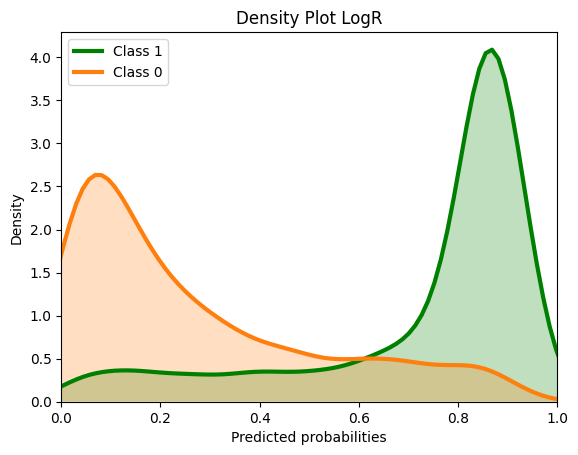

In [134]:
distribution(LR1_probs, ' LogR')
plt.xlim(0.0, 1.00)
plt.savefig('dist_LR_.png')

The missing bins have midpoint values of  
plot curves and save in one png file


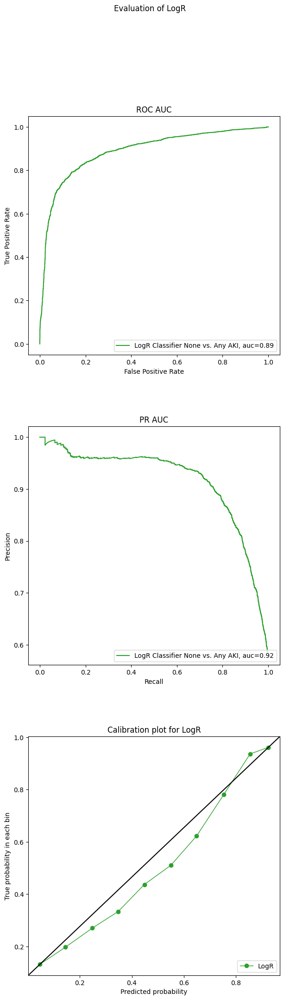

In [135]:
classifier_name = "None vs. Any AKI"    ###change every time #Moderate vs. Severe #None vs. Any #Others vs. Severe
plot_name = "LogR"
build_graphs(y_test, LR1_probs, classifier_name, plot_name, "LogR")


# XGB

(4776, 2)


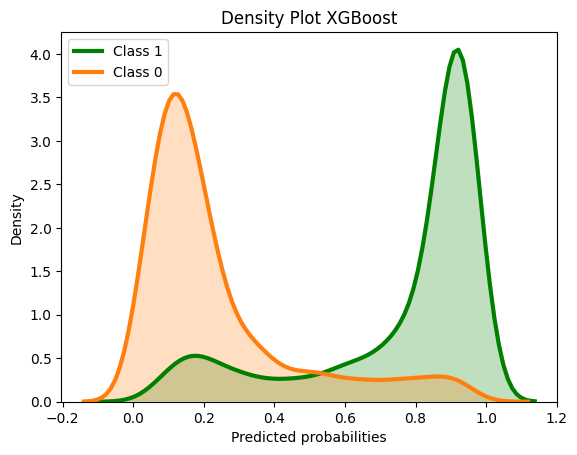

In [136]:
distribution(GBT_probs, ' XGBoost')
plt.savefig('dist_XGB_NOimp.png')

The missing bins have midpoint values of  
plot curves and save in one png file


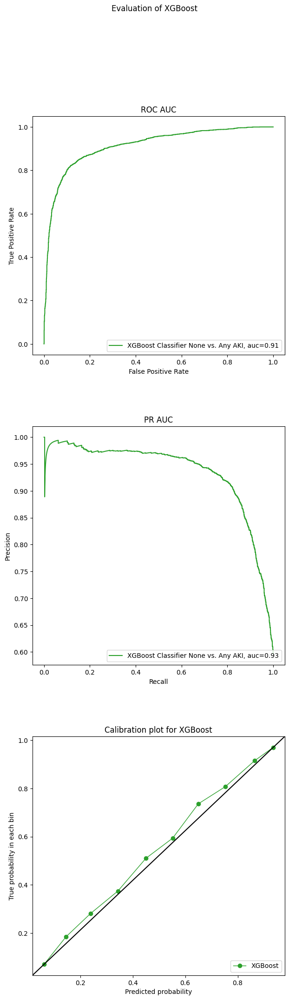

In [137]:
classifier_name = "None vs. Any AKI"    ###change every time #Moderate vs. Severe #None vs. Any #Others vs. Severe
plot_name = "XGBoost"
build_graphs(y_test, GBT_probs, classifier_name, plot_name, "XGBoost")

# RF

In [138]:
RF_probs.min()

0.00015873015873015873

(4776, 2)


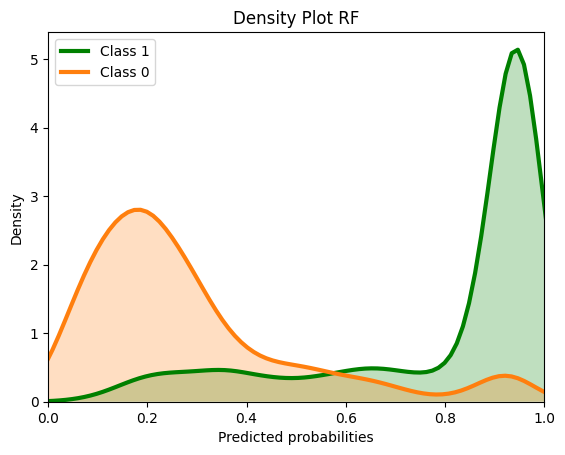

In [139]:
distribution(RF_probs, ' RF')
plt.xlim(0.0, 1.00)
plt.savefig('best.png')

The missing bins have midpoint values of  
plot curves and save in one png file


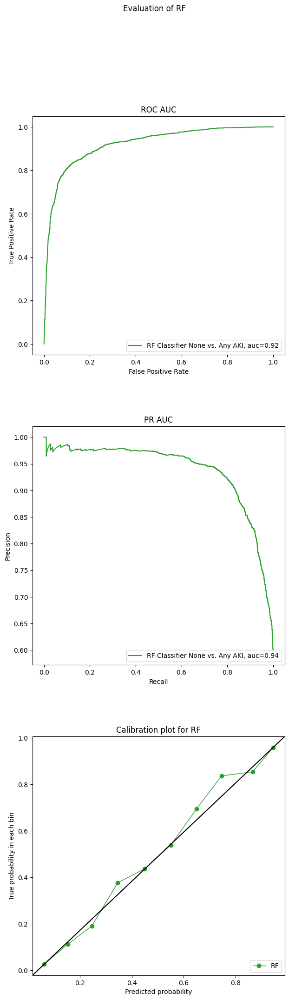

In [140]:
classifier_name = "None vs. Any AKI"    ###change every time #Moderate vs. Severe #None vs. Any #Others vs. Severe
plot_name = "RF"
build_graphs(y_test, RF_probs, classifier_name, plot_name, "RF")

# Hyperparameters tuning

# LogR

In [ ]:
# first default 
print(datetime.now())
# Train binary-classification model with logistic regression
print("build LR")
model_LR1 = LogisticRegression(penalty = "l1", C = 1,fit_intercept = True, solver = 'saga', max_iter= 1000, 
                                  class_weight= 'balanced', random_state=42)
print("train LR")
model_LR1.fit(X_train, y_train) 
# Make predictions
print("predictions before tuning")
LR1_pred = model_LR1.predict(X_test)
# Predict probabilities on testing points
LR1_probs = model_LR1.predict_proba(X_test)[::,1]
print(datetime.now())

performance(y_test,LR1_probs)

In [ ]:
C = [0.001, 0.01, 0.1, 1, 10, 100] 
INTERCEPT = [True, False]
penalty = ['l1', 'l2']

# Create the random grid
random_grid_LR = {'C': C,'fit_intercept': INTERCEPT, 'penalty':penalty}
print(random_grid_LR)
# Random search training. Use the random grid to search for best hyperparameters
# Random search of parameters, using 5 fold cross validation

lr_random = RandomizedSearchCV(estimator = model_LR1, param_distributions = random_grid_LR, n_iter = 25, cv = 5, verbose=2, random_state=42, n_jobs = 1)
starttime =datetime.now() 
lr_random.fit(X_train, y_train)
print("starttime =", starttime)
print("endtime =", datetime.now())

# best parameters  (over 30 hours)
#'fit_intercept': True, 'C': 0.1 , intercept True, penalty l1.
lr_random.best_params_


# XGB

In [ ]:
counter=collections.Counter(y_train)
SCALE_POS_WEIGHT = round(counter[0]/counter[1],1)
print("build GBT")
#build gradient boost model
xgb1_model = xgb.XGBClassifier(
 learning_rate = 0.1,
 n_estimators= 100,# the number of boosting rounds or trees to build, equal to XGBoost API num_boost_round
 max_depth= 5, #should be between 3-10
 min_child_weight= 1, # a smaller value is chosen because it is a imbalanced class problem and leaf nodes can have smaller size groups
 gamma= 0,
 subsample= 0.8,#typical values range between 0.5-0.9
 colsample_bytree= 0.8,#typical values range between 0.5-0.9
 objective= 'binary:logistic',
 nthread= 4,
 scale_pos_weight= SCALE_POS_WEIGHT,
 seed= 42)

#AL: reg_lambda=1 # default

print("train GBT")
# train xgb
xgb1_model.fit(X_train, y_train, 
                early_stopping_rounds= 40, 
                eval_metric= ["auc", "error", "logloss"] , 
                eval_set= [(X_test, y_test)],
                verbose= False)
print("predictions before tuning")
#Make predictions 
GBT1_pred = xgb1_model.predict(X_test)
GBT1_probs = xgb1_model.predict_proba(X_test)[::,1]
performance(y_test,GBT1_probs)



In [ ]:

learning_rate = [0.01,0.1]
n_estimators = [20,30,40,50,60,70,80,100]
max_depth = [5,7,9]
min_child_weight = [1,3,5,7]
gamma =  [0, 0.5, 1]


# Create the random grid
random_grid_xgb = {'learning_rate': learning_rate,
               'n_estimators': n_estimators,
               'max_depth': max_depth,
               'min_child_weight': min_child_weight,
               'gamma': gamma}
print(random_grid_xgb)

# Random search training
xgb_random = RandomizedSearchCV(estimator = xgb_model, param_distributions = random_grid_xgb, n_iter = 50, cv = 5, verbose=2, random_state=42, n_jobs = 1)


starttime =datetime.now() 
xgb_random.fit(X_train, y_train)
print("starttime =", starttime)
print("endtime =", datetime.now())

#xgb_random.best_params_

# best parameters for full features data set 
# full features
'''
{'n_estimators': 70,
'min_child_weight': 3,
'max_depth': 7,
'learning_rate': 0.1,
'gamma': 0.5}

'''

xgb_random.best_params_

# RF

In [ ]:
# search how to do a CV=5 in each model (sklearn function maybe)

print("build RF")
# building RF (default parameters) to compare to later
rf1_model = RandomForestClassifier(n_estimators=100,criterion='gini',max_depth=None,min_samples_split=2,min_samples_leaf=1,
                                  min_weight_fraction_leaf=0.0,max_features='auto',max_leaf_nodes=None,min_impurity_decrease=0.0,
                                  min_impurity_split=None,bootstrap=True,oob_score=False,n_jobs=None,random_state=None,verbose=0,
                                  warm_start=False,class_weight=None,ccp_alpha=0.0,max_samples=None)


print("train RF")
# train RF
rf1_model.fit(X_train, y_train)
# to see how the forest looks like with default parameters

# depth of trees is around 44-93 for the full set
#[estimator.tree_.max_depth for estimator in rf_model.estimators_]

print("predictions")
#Make predictions 
RF1_pred = rf1_model.predict(X_test)
RF1_probs = rf1_model.predict_proba(X_test)[::,1] # probability of class 1

performance(y_test,RF1_probs)



In [ ]:

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
# Number of features to consider at every split
max_features = ['auto']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 60, num = 10)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

# Random search training
# Use the random grid to search for best hyperparameters
# Random search of parameters, using 3 fold cross validation
rf_random = RandomizedSearchCV(estimator = rf_model, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = 1)


#Fit the random search model  
starttime =datetime.now() 
rf_random.fit(X_train, y_train)
print("starttime =", starttime)
print("endtime =", datetime.now())

rf_random.best_params_

# max optimized
'''
{'n_estimators': 700,
'min_samples_split': 10,
'min_samples_leaf': 2,
'max_features': 'auto',
'max_depth': 40,
'bootstrap': False}
'''

